In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
from subprocess import check_output
from wordcloud import WordCloud, STOPWORDS
import csv
import json
import time
from datetime import datetime
from matplotlib import cm
from bidi.algorithm import get_display
import arabic_reshaper
import re
import spacy
from spacy.lang.ar.stop_words import STOP_WORDS
from spacy.lang.ar import Arabic
import string 
from tqdm import tqdm
import seaborn as sns
import nltk
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.linear_model import LogisticRegression
from nltk.corpus import stopwords as sw
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer
import chart_studio.plotly as py
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.figure_factory as ff
import plotly.tools as tls
from sklearn.decomposition import NMF, LatentDirichletAllocation, TruncatedSVD
import pyLDAvis
import pyLDAvis.sklearn
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Embedding, LSTM, Dense, Dropout
from keras.preprocessing.text import Tokenizer
from keras.callbacks import EarlyStopping
from keras.models import Sequential
import keras.utils as ku 
import warnings
warnings.filterwarnings("ignore")
nltk.download('stopwords')
matplotlib.rcParams['figure.figsize'] = (10, 10)

Using TensorFlow backend.
C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:527: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:528: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:529: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (t

In [2]:
df_original= pd.read_csv("dataset_mpcmasr.csv")

In [3]:
df=df_original.copy()

"""
id              ==>		video id 
v_title         ==>		video title
tags            ==>		Video tags
categ_id        ==>		Category id
v_pub_dt        ==>		Publish date
vws             ==>		Number of views
lks             ==>		Number of likes
dslks           ==>		Number of dislikes
cmnts           ==>		Number of comments
duration        ==>		Video length
ply_id          ==>		play list id
ply_lst_title	==>		Play list title
"""

In [4]:
#Looking some information of the data
print("Rows:",df.shape[0],"Columns:",df.shape[1])
print()
print("Count all unique for each column:")
print(df.nunique())

Rows: 6235 Columns: 12

Count all unique for each column:
id               3014
v_title          3008
ply_lst_title      29
tags              209
categ_id           11
v_pub_dt         3001
vws              2254
lks               646
dslks             264
cmnts             238
duration          543
ply_id             29
dtype: int64


In [5]:
df['likes_log'] = np.log(df['lks'] + 1)
df['views_log'] = np.log(df['vws'] + 1)
df['dislikes_log'] = np.log(df['dslks'] + 1)
df['comment_log'] = np.log(df['cmnts'] + 1)

# Processing all duplicates

Count of unique videos 3014 from 6235 that means we have half of all videos are duplicated
we need to check if all rows dublicated or just all videos

In [6]:
duplicateRows=df[df.duplicated()]
print("Duplicate rows count:",len(duplicateRows))

Duplicate rows count: 0


In [7]:
#Remove all duplicates and keep first one
df.drop_duplicates(keep='first', inplace=True)

In [8]:
#Check all duplicates again
duplicateRows=df[df.duplicated()]
print("Duplicate rows count:",len(duplicateRows))

Duplicate rows count: 0


In [9]:
# Select all duplicates based on play list id and video id columns
duplicateRowsbyVideoAndPlayList = df[df.duplicated(['id', 'ply_id'])]
print("All duplicates based on play list id and video id:", len(duplicateRowsbyVideoAndPlayList))

All duplicates based on play list id and video id: 432


In [10]:
df.drop_duplicates(subset=['id', 'ply_id'], keep='first', inplace=True)

In [11]:
#Check all duplicates again
duplicateRowsbyVideoAndPlayList = df[df.duplicated(['id', 'ply_id'])]
print("All duplicates based on play list id and video id:", len(duplicateRowsbyVideoAndPlayList))

All duplicates based on play list id and video id: 0


In [12]:
print("Total number of non null observations present including the total number of entries:")
print()
print(df.info())

Total number of non null observations present including the total number of entries:

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5803 entries, 0 to 6234
Data columns (total 16 columns):
id               5803 non-null object
v_title          5803 non-null object
ply_lst_title    5803 non-null object
tags             2956 non-null object
categ_id         5803 non-null int64
v_pub_dt         5803 non-null object
vws              5803 non-null int64
lks              5803 non-null int64
dslks            5803 non-null int64
cmnts            5803 non-null int64
duration         5803 non-null object
ply_id           5803 non-null object
likes_log        5803 non-null float64
views_log        5803 non-null float64
dislikes_log     5803 non-null float64
comment_log      5803 non-null float64
dtypes: float64(4), int64(5), object(7)
memory usage: 770.7+ KB
None


In [13]:
df.describe()
print("Summary statistics of all observed features and labels:")
print()
print(df.describe())

Summary statistics of all observed features and labels:

          categ_id           vws            lks         dslks        cmnts  \
count  5803.000000  5.803000e+03    5803.000000   5803.000000  5803.000000   
mean     20.688265  9.755371e+04     701.525418     59.403757    45.210064   
std       7.727912  6.560075e+05    4347.579635    494.328518   346.633794   
min       1.000000  1.070000e+02       0.000000      0.000000     0.000000   
25%      24.000000  5.390000e+02       6.000000      1.000000     1.000000   
50%      24.000000  1.328000e+03      18.000000      3.000000     3.000000   
75%      24.000000  8.280000e+03     106.000000     12.000000    10.000000   
max      26.000000  2.170572e+07  104727.000000  13425.000000  9154.000000   

         likes_log    views_log  dislikes_log  comment_log  
count  5803.000000  5803.000000   5803.000000  5803.000000  
mean      3.501430     7.956385      1.778601     1.694031  
std       2.167369     2.285264      1.643821     1.57508

In [14]:
#Set the index to become the ‘id’ column:
df.set_index('id')

,v_title,ply_lst_title,tags,categ_id,v_pub_dt,vws,lks,dslks,cmnts,duration,ply_id,likes_log,views_log,dislikes_log,comment_log
id,,,,,,,,,,,,,,,
iVVPro2nRd8,قوموا الآن بترشيح مواهب من أصحاب الهمم,mbc hope,NaN,1,2019-10-17T11:52:31.000Z,854,7,3,0,PT39S,PL4UpjxLgAyAUyrFYgtDgbhg_dZPFJyOaX,2.079442,6.751101,1.386294,0.000000
iVVPro2nRd8,قوموا الآن بترشيح مواهب من أصحاب الهمم,MBCMASR,NaN,1,2019-10-17T11:52:31.000Z,854,7,3,0,PT39S,PL4UpjxLgAyAVUWVwjTTSq4Cbgu48uGhmn,2.079442,6.751101,1.386294,0.000000
LbPyi5fQeSw,الخطة المدروسة التي اعتمدها حماقي ضد أحلام #MB...,MBCMASR,"نجوم,غناء,راغبعلامة,سميرهسعيد,SamiraSaid,أحلى ...",24,2019-10-12T19:37:28.000Z,143290,1029,41,63,PT59S,PL4UpjxLgAyAVUWVwjTTSq4Cbgu48uGhmn,6.937314,11.872633,3.737670,4.158883
JXsRqc3Q_HU,بعد انقطاعها عن الغناء لسنوات.. رابعة عادت لته...,MBCMASR,"MBCTheVoiceKids,#MBCTheVoiceKids,MBC The Voice...",24,2019-10-12T18:45:24.000Z,2625810,17296,852,1474,PT1M28S,PL4UpjxLgAyAVUWVwjTTSq4Cbgu48uGhmn,9.758288,14.780900,6.748760,7.296413
IVXMnto9CgM,عصام مرعي يكشف كواليس إصابه ميتشو بالسرطان,MBCMASR,NaN,24,2019-12-05T11:53:39.000Z,1552,57,9,6,PT1M9S,PL4UpjxLgAyAVUWVwjTTSq4Cbgu48uGhmn,4.060443,7.347944,2.302585,1.945910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HY93mtbqhyw,صراخ عبير صبرى فى طائرة رامز واكل الجو,رامز واكل الجو,NaN,24,2015-07-04T17:49:06.000Z,1233632,1390,327,0,PT1M30S,PL4UpjxLgAyAXIu_MxoYeTiwq4tSfPh6I_,7.237778,14.025474,5.793014,0.000000
6nvixsuqGpI,علقة عاصى الحلانى لرامز جلال فى رامز واكل الجو,رامز واكل الجو,NaN,24,2015-07-03T18:11:15.000Z,3854928,12390,1091,0,PT1M41S,PL4UpjxLgAyAXIu_MxoYeTiwq4tSfPh6I_,9.424726,15.164863,6.995766,0.000000
HStaE72Kv48,صدمة عاصى الحلانى فى طائرة رامز واكل الجو,رامز واكل الجو,NaN,24,2015-07-03T18:02:46.000Z,1129545,2906,285,0,PT1M29S,PL4UpjxLgAyAXIu_MxoYeTiwq4tSfPh6I_,7.974877,13.937326,5.655992,0.000000


# Processing the null values
So to do some sort of data cleaning, and to get rid of those null values, we put an empty string in place of each null value in the tags column

In [15]:
print("Total number of NaN")
print()
print(df.isnull().sum())
df["tags"] = df["tags"].fillna(value="")

Total number of NaN

id                  0
v_title             0
ply_lst_title       0
tags             2847
categ_id            0
v_pub_dt            0
vws                 0
lks                 0
dslks               0
cmnts               0
duration            0
ply_id              0
likes_log           0
views_log           0
dislikes_log        0
comment_log         0
dtype: int64


# Processing the dates
If we look at the v_pub_dt column we see that is not yet in the correct format of datetime data.


In [16]:
df['publish_time'] = pd.to_datetime(df['v_pub_dt'], format='%Y-%m-%dT%H:%M:%S.%fZ')
df['publish_time'].head()

0   2019-10-17 11:52:31
1   2019-10-17 11:52:31
2   2019-10-12 19:37:28
3   2019-10-12 18:45:24
4   2019-12-05 11:53:39
Name: publish_time, dtype: datetime64[ns]

## Separates date and time into two columns from 'publish_time' column

In [17]:
df.insert(5, 'publish_date', df['publish_time'].dt.date)
df['publish_time'] = df['publish_time'].dt.time
df[['publish_date', 'publish_time']].head()

,publish_date,publish_time
0,2019-10-17,11:52:31
1,2019-10-17,11:52:31
2,2019-10-12,19:37:28
3,2019-10-12,18:45:24
4,2019-12-05,11:53:39


# Processing categ_id column
Here we are adding the category column after the categ_id column, using the US_category_id.json file for lookup.

In [18]:
# creates a dictionary that maps `categ_id` to `category`
id_to_category = {}
with open('US_category_id.json', 'r') as f:
    data = json.load(f)
    for category in data:
        id_to_category[category] = data[category]
print(id_to_category)


{'1': 'Film & Animation', '10': 'Music', '15': 'Pets & Animals', '17': 'Sports', '18': 'Short Movies', '19': 'Travel & Events', '2': 'Autos & Vehicles', '20': 'Gaming', '21': 'Videoblogging', '22': 'People & Blogs', '23': 'Comedy', '24': 'Entertainment', '25': 'News & Politics', '26': 'Howto & Style', '27': 'Education', '28': 'Science & Technology', '29': 'Nonprofits & Activism', '30': 'Movies', '31': 'Anime/Animation', '32': 'Action/Adventure', '33': 'Classics', '34': 'Comedy', '35': 'Documentary', '36': 'Drama', '37': 'Family', '38': 'Foreign', '39': 'Horror', '40': 'Sci-Fi/Fantasy', '41': 'Thriller', '42': 'Shorts', '43': 'Shows', '44': 'Trailers'}


In [19]:
df['categ_id'] = df['categ_id'].astype(str)
df.insert(2, 'category', df['categ_id'].map(id_to_category))
df[['categ_id', 'category']].head()

,categ_id,category
0,1,Film & Animation
1,1,Film & Animation
2,24,Entertainment
3,24,Entertainment
4,24,Entertainment


# Correlation analysis and heatmap

In [20]:
keep_columns = ['vws', 'lks', 'dslks', 'cmnts'] # only looking at correlations between these variables
corr_matrix = df[keep_columns].corr()
print(corr_matrix)

            vws       lks     dslks     cmnts
vws    1.000000  0.787086  0.815959  0.453485
lks    0.787086  1.000000  0.915939  0.841588
dslks  0.815959  0.915939  1.000000  0.755731
cmnts  0.453485  0.841588  0.755731  1.000000


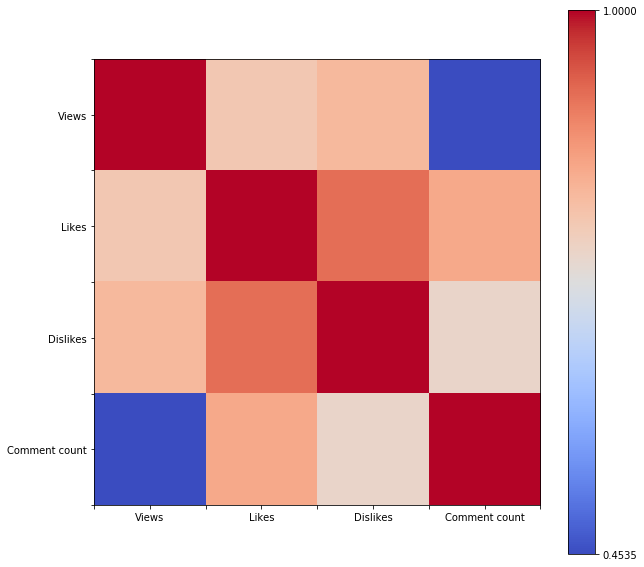

In [21]:
matplotlib.rcParams['figure.figsize'] = (10, 10)
fig, ax = plt.subplots()
heatmap = ax.imshow(corr_matrix, interpolation='nearest', cmap=cm.coolwarm)

# making the colorbar on the side
cbar_min = corr_matrix.min().min()
cbar_max = corr_matrix.max().max()
cbar = fig.colorbar(heatmap, ticks=[cbar_min, cbar_max])

# making the labels
labels = ['']
for column in ['Views', 'Likes', 'Dislikes', 'Comment count']:
    labels.append(column)
    labels.append('')
ax.set_yticklabels(labels, minor=False)
ax.set_xticklabels(labels, minor=False)

plt.show()

# Visualizing most statistics
Here we want to look at the videos that have the most views, likes, dislikes, comments, etc. For convenience purposes, we will write a function that would take in a column name and visualize the videos that have the most counts for statistics specified by the column name.

In [22]:
def visualize_most(df, column,title,ylabel,qry_col='N/A',qry='N/A',xlabel='Videos', num=10):
    if qry_col!='N/A'  and qry!='N/A': 
        sorted_df = df[df[qry_col]==qry].sort_values(column, ascending=False).iloc[:num]
    else:
        sorted_df = df.sort_values(column, ascending=False).iloc[:num]
    ax = sorted_df[column].plot.bar()
    labels = []
    for item in sorted_df['v_title']:
        labels.append(get_display(arabic_reshaper.reshape(item)))
    ax.set_xticklabels(labels, rotation=90, fontsize=15)
    plt.title(" Top "+str(num)+" " + get_display(arabic_reshaper.reshape(title)))
    plt.xlabel(get_display(arabic_reshaper.reshape(xlabel)))
    plt.ylabel(get_display(arabic_reshaper.reshape(ylabel)))

    plt.show()

In [23]:
# dropping ALL duplicte values 
df_unique = df.reset_index().drop_duplicates(subset='id', keep='first').set_index('id')

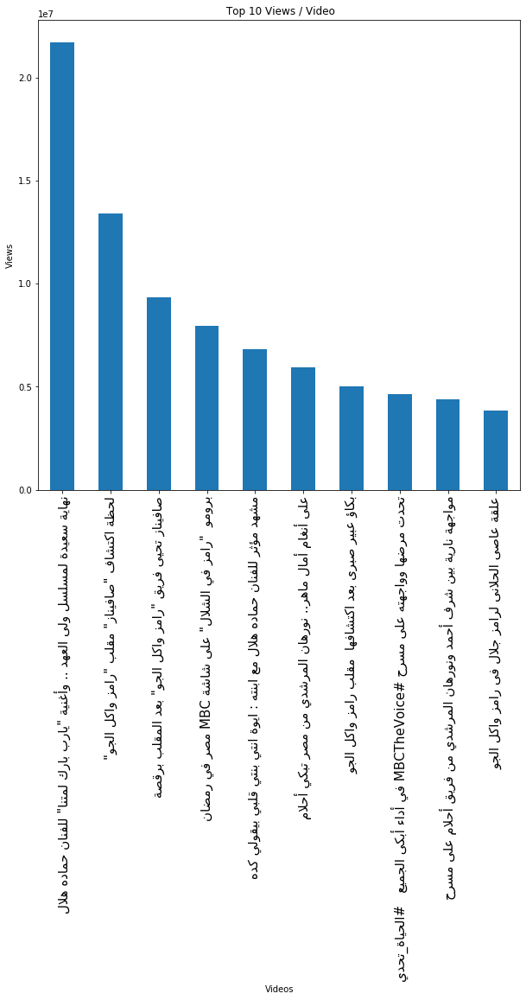

In [24]:
visualize_most(df_unique, 'vws','Views / Video','Views')

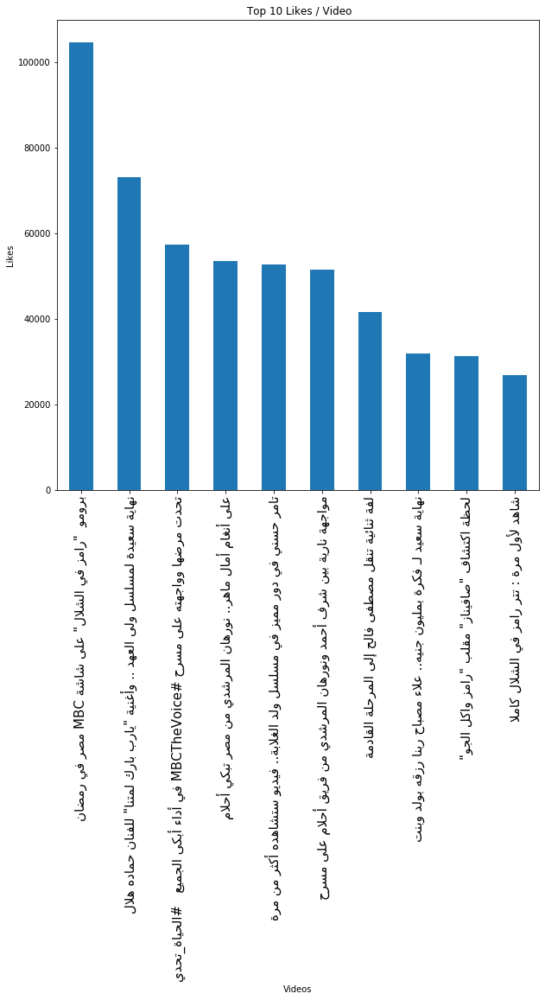

In [25]:
visualize_most(df_unique, 'lks','Likes / Video','Likes')

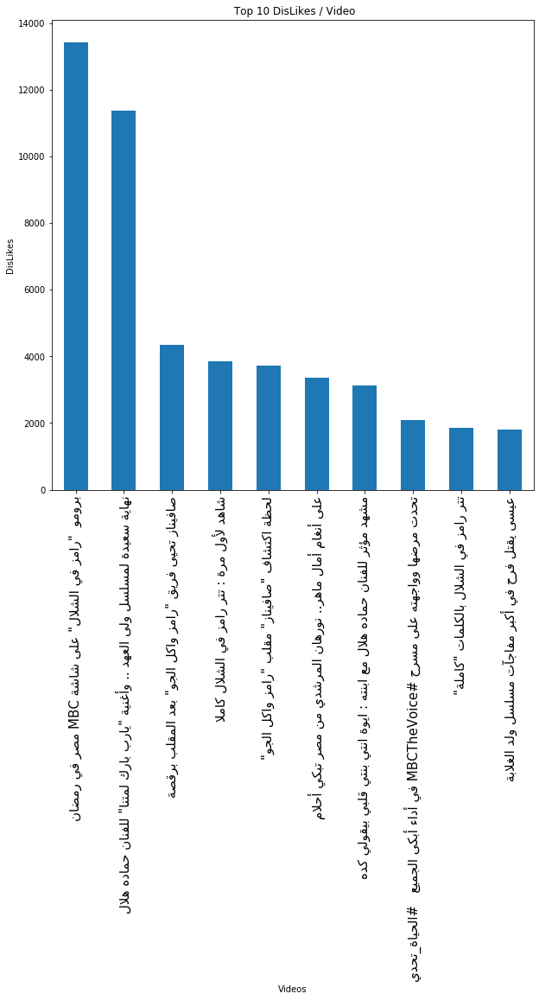

In [26]:
visualize_most(df_unique, 'dslks','DisLikes / Video','DisLikes')

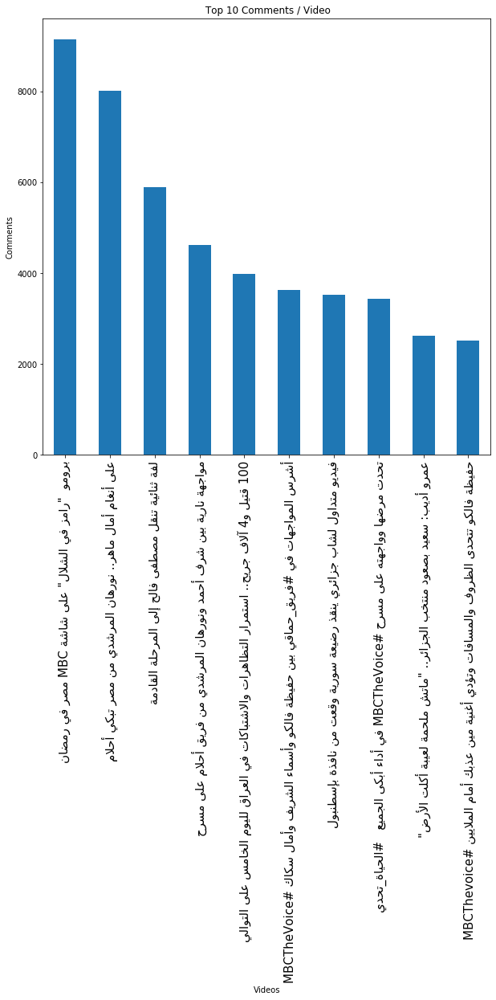

In [27]:
visualize_most(df_unique, 'cmnts','Comments / Video','Comments')

#  Views/Likes/Dislikes/Comments for each Play lists

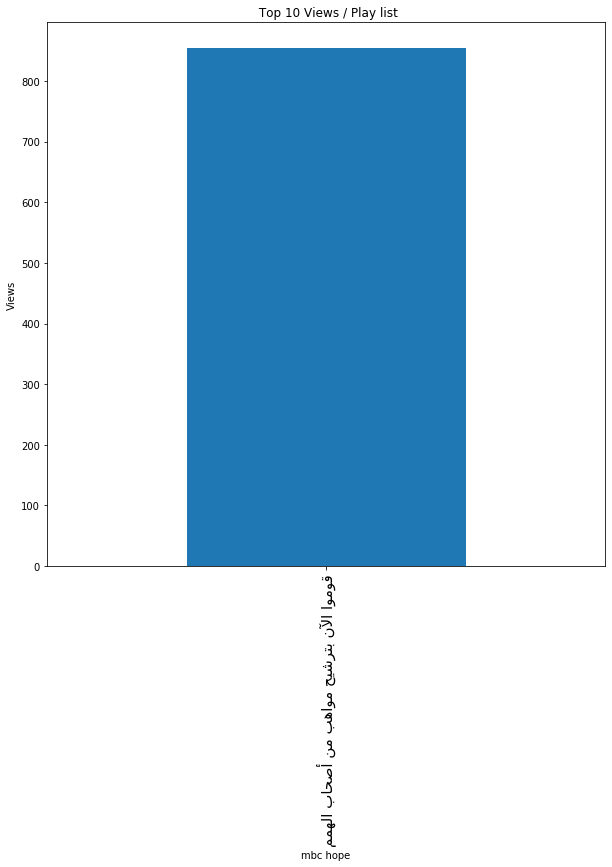

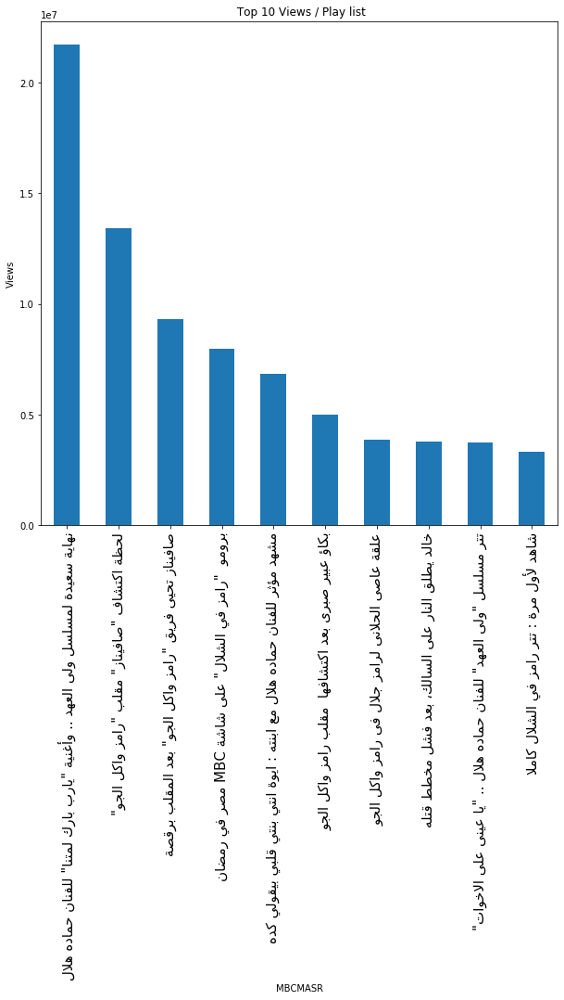

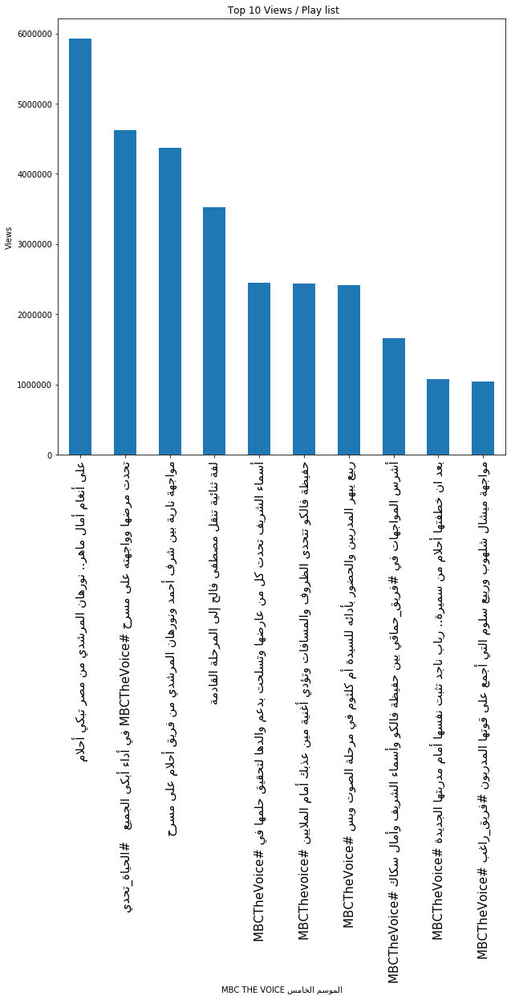

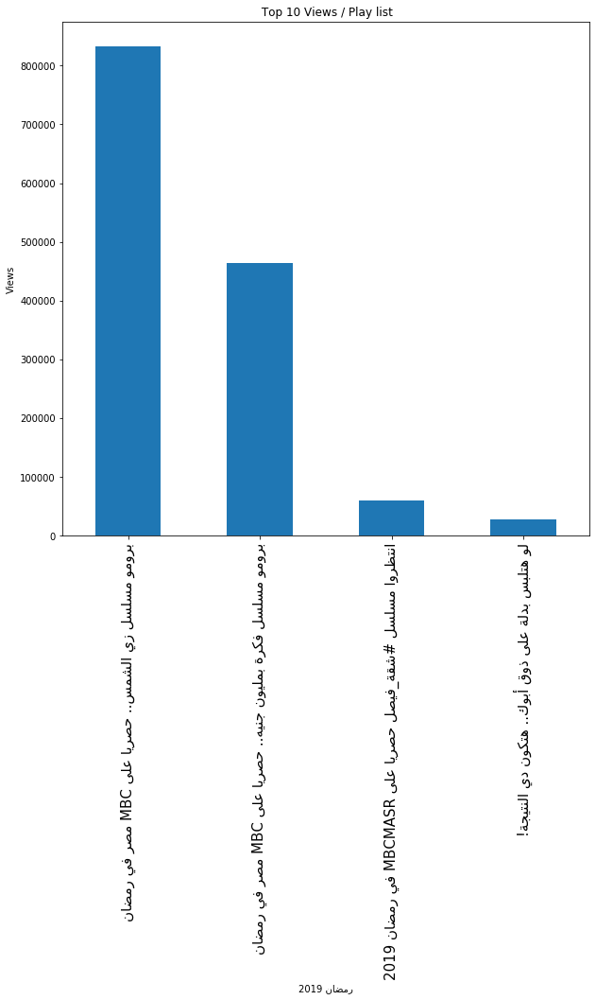

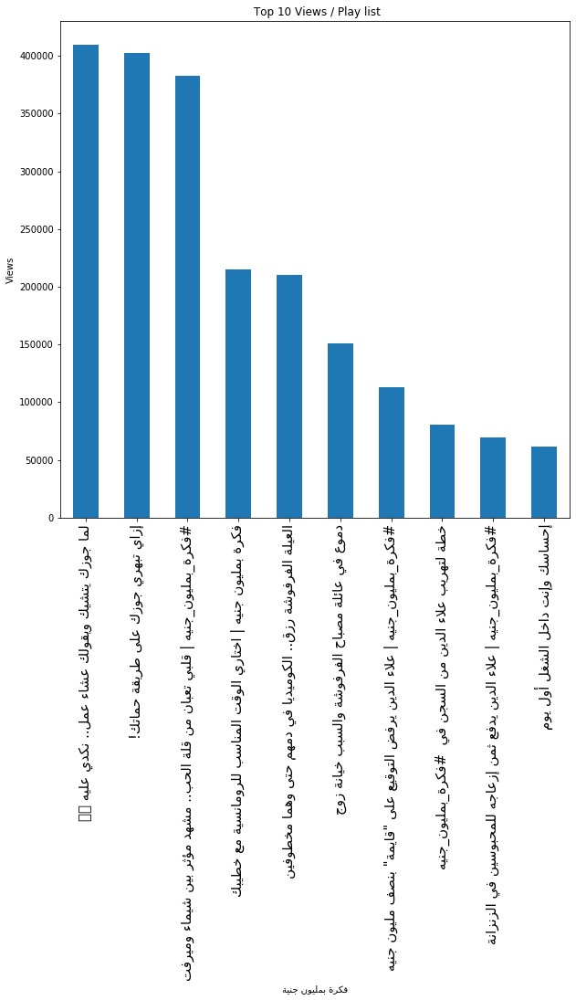

...

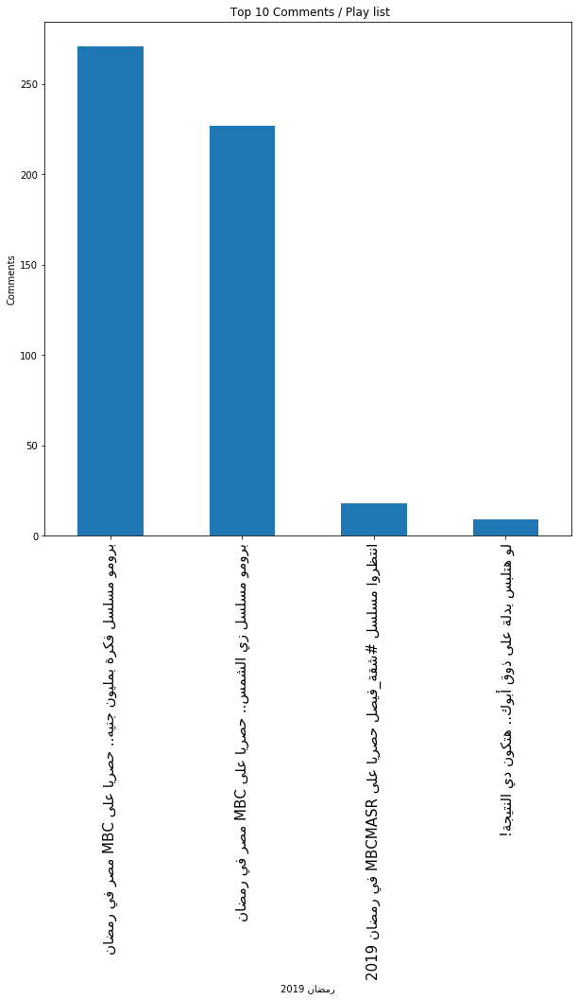

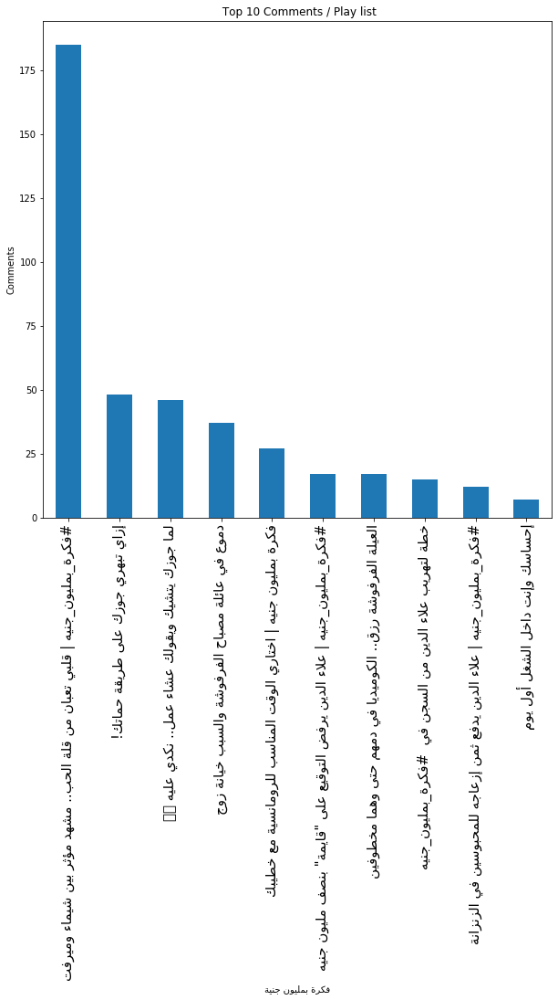

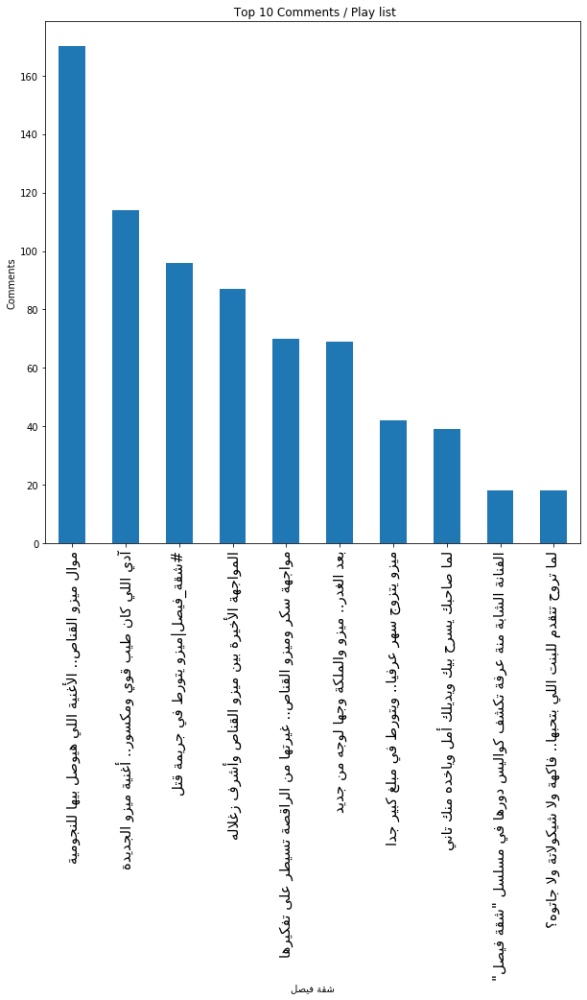

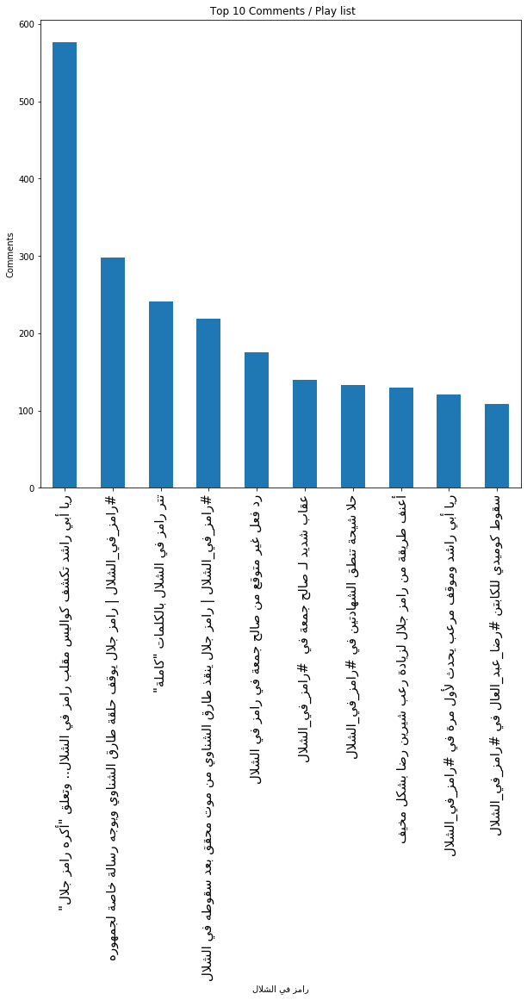

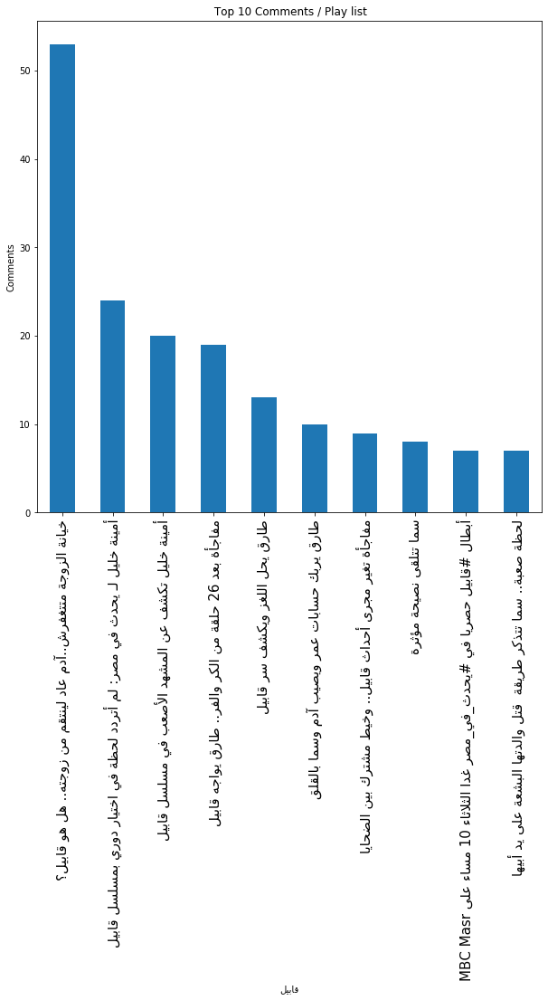

In [28]:
col_dict={'vws':'Views', 'lks':'Likes', 'dslks':'Dislikes', 'cmnts':'Comments'}
for col in col_dict.keys():
    for ply_lst in df_unique.ply_lst_title.unique():
        visualize_most(df_unique,col,col_dict[col]+' / Play list',col_dict[col],'ply_lst_title',ply_lst,ply_lst)

#  Views/Likes/Dislikes/Comments for each Category

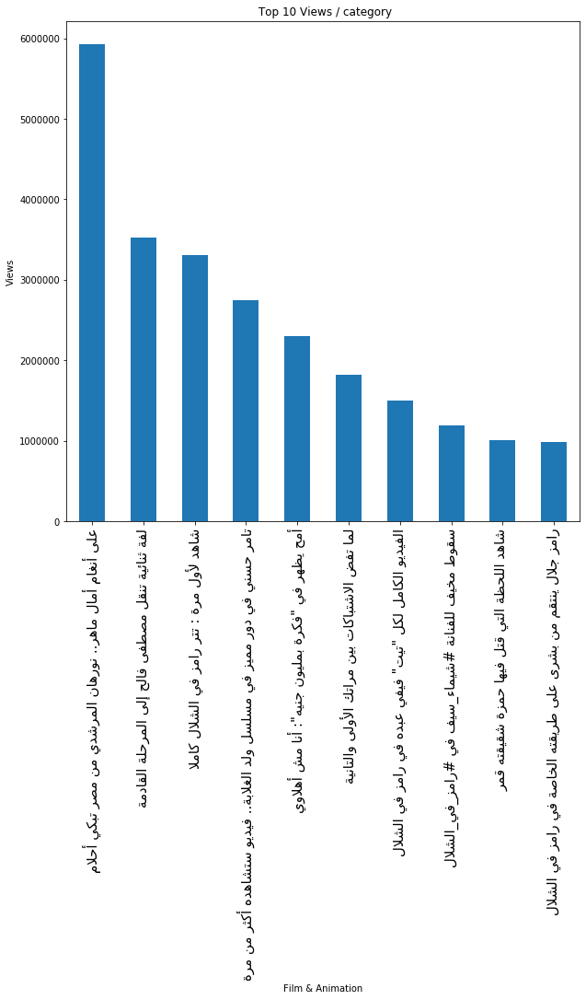

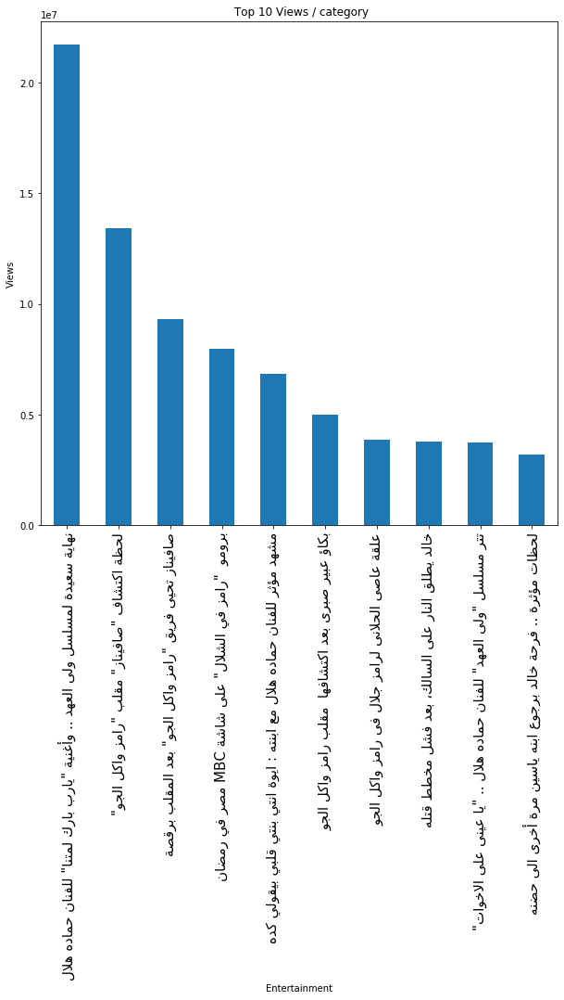

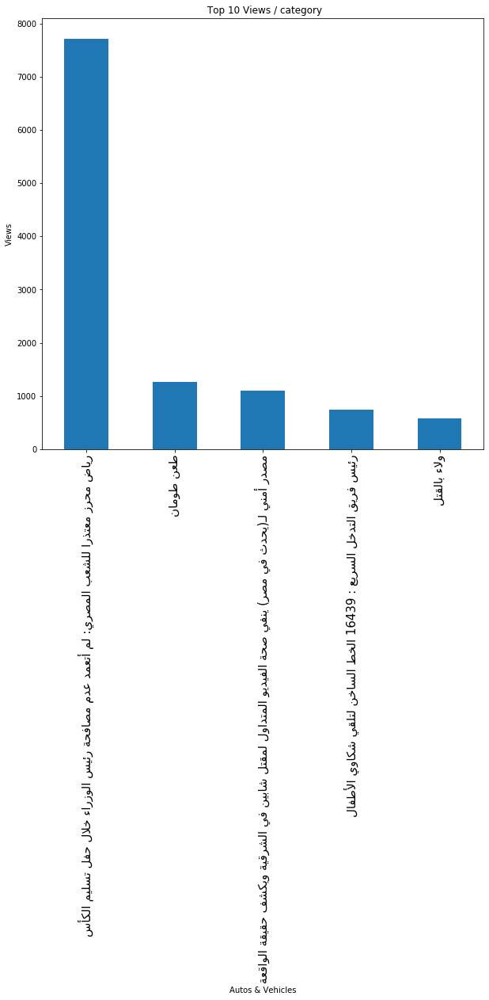

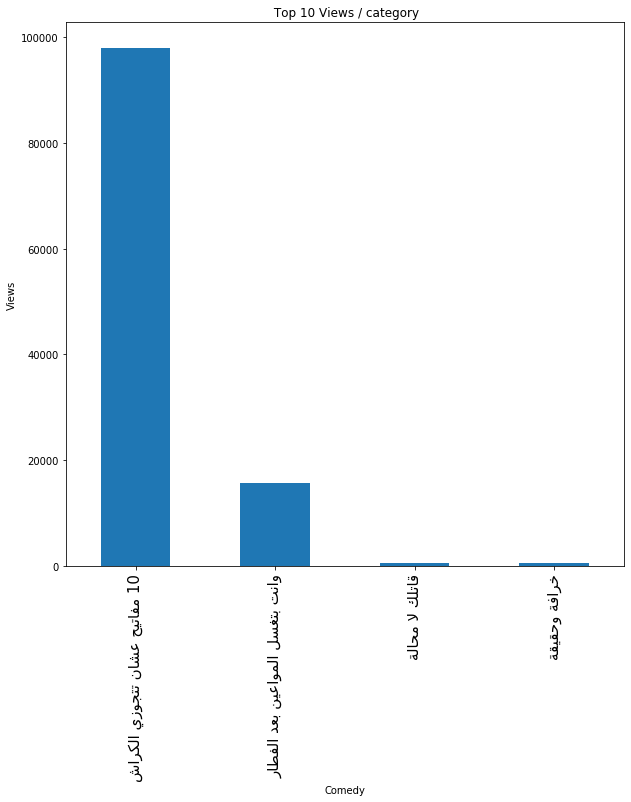

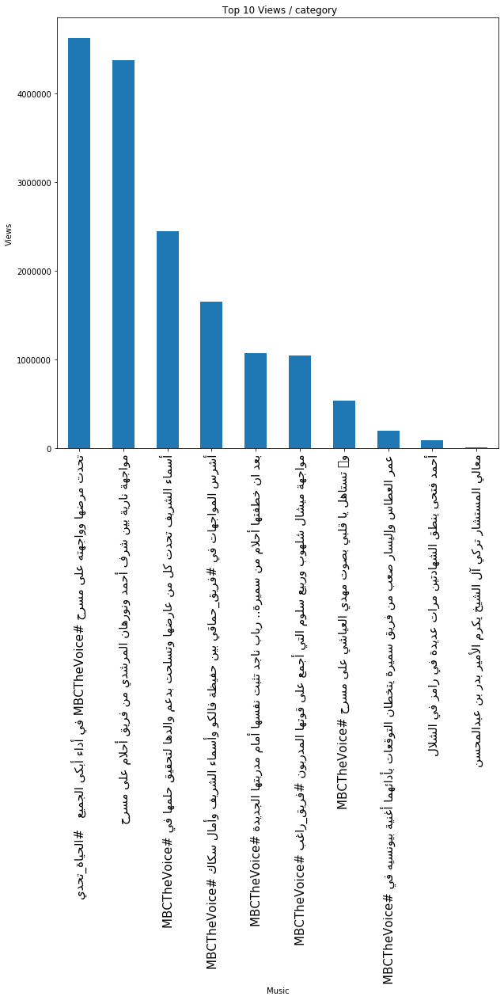

...

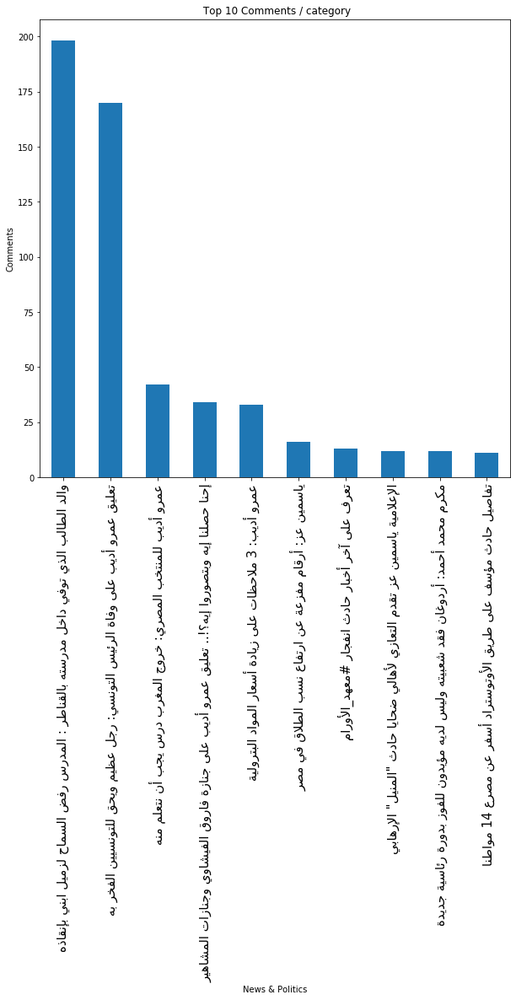

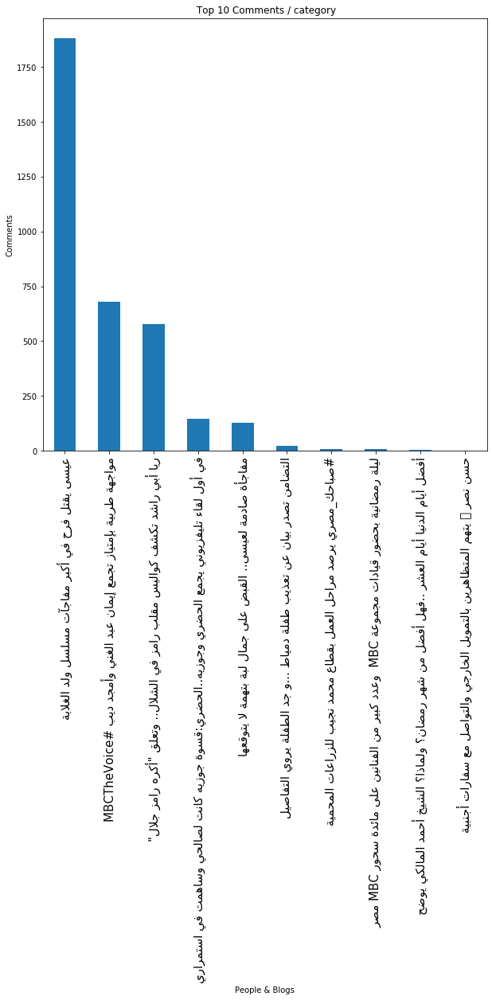

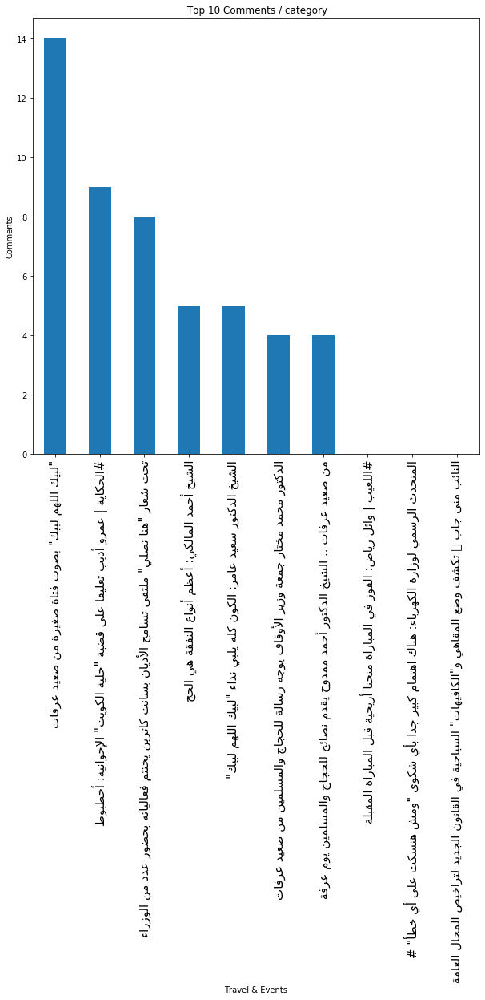

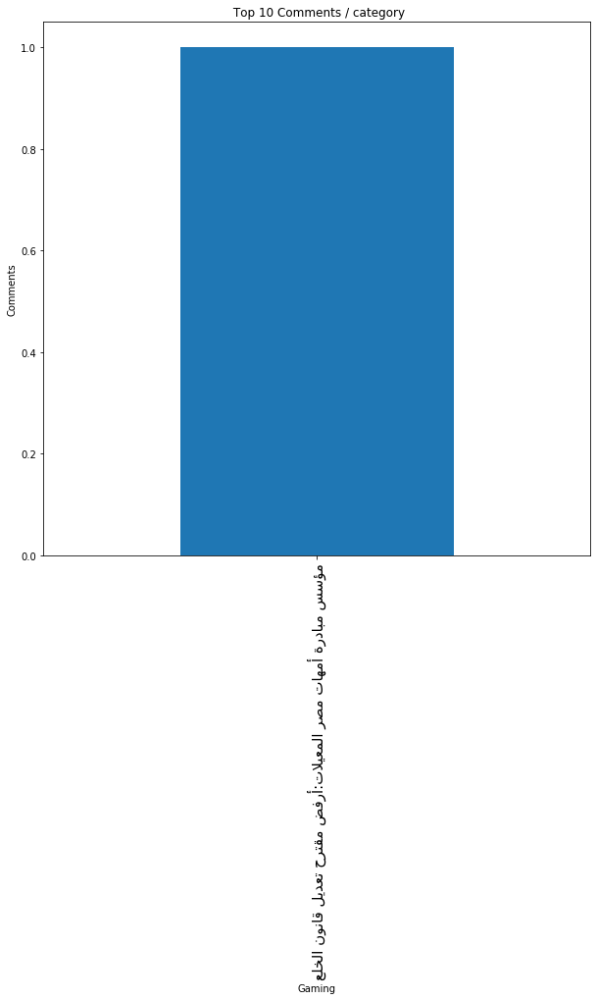

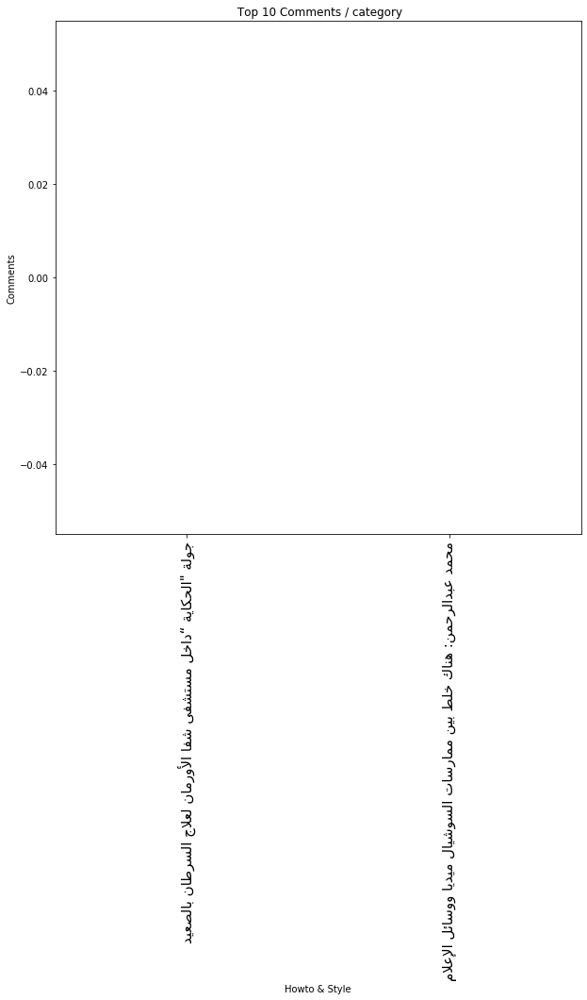

In [29]:
for col in col_dict.keys():
    for categ in df_unique.category.unique():
        visualize_most(df_unique,col,col_dict[col]+' / category',col_dict[col],'category',categ,categ)

# Videos views according to their Likes and Dislikes

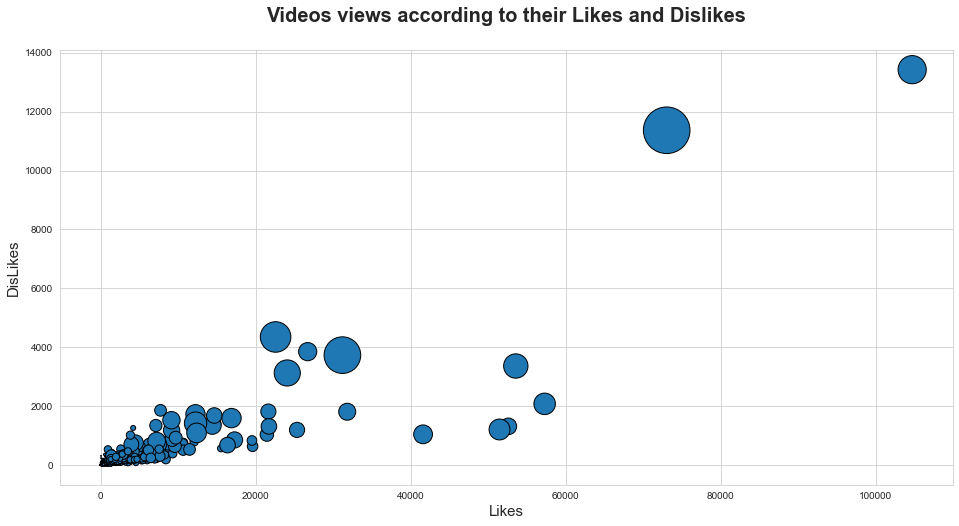

In [30]:
plt.figure(figsize=(16,8))
sns.set_style("whitegrid")
plt.title('Videos views according to their Likes and Dislikes', fontsize=20, fontweight='bold', y=1.05,)
plt.xlabel('Likes', fontsize=15)
plt.ylabel('DisLikes', fontsize=15)

likes = df_unique["lks"].values
dislikes = df_unique["dslks"].values
views = df_unique["vws"].values
plt.scatter(likes, dislikes, s = views/10000, edgecolors='black')
plt.show()

# Finding Outlier
I will use number of view as the variable to define the popularity of video. In the analysis, a popular video means the number of view for the video is more than 1.5 interquartile ranges (IQRs) above the third quartile. 

In [31]:
Q1 = df_unique.vws.quantile(0.25)
Q3 = df_unique.vws.quantile(0.75)
IQR = Q3 - Q1
print("IQR:",IQR)

popular_videos=df_unique.loc[df_unique.vws > (Q3 + 1.5 * IQR)]

df_unique['popular']=0
df_unique.loc[df_unique.vws > (Q3 + 1.5 * IQR),'popular']=1

df_unique['popular'].value_counts()

IQR: 5256.5


0    2452
1     562
Name: popular, dtype: int64

In [32]:
#make a variable that tells ratio of like and dislike
df_unique['like_percentage']=(df_unique['lks']/(df_unique['lks']+df_unique['dslks'])*100)

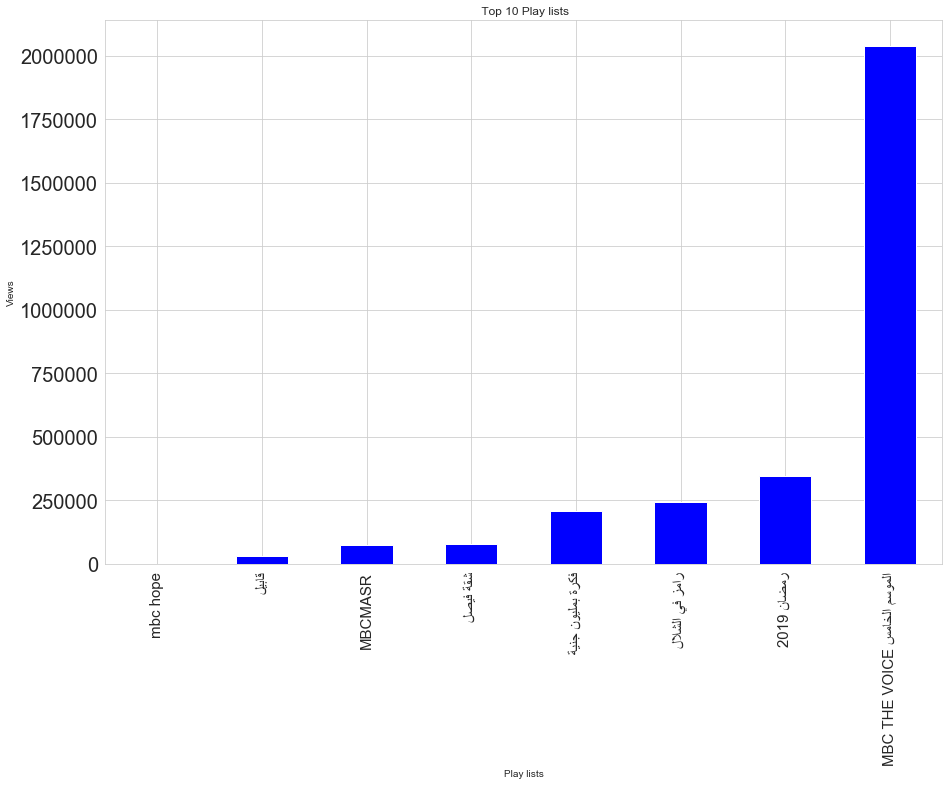

In [33]:
fig = plt.figure(figsize=(15, 10))
top10=df_unique.groupby('ply_id').mean().sort_values(by=['vws'], ascending=False)[:10].vws.sort_values(ascending=True)
ax=top10.plot(kind='bar',colormap='winter',fontsize=20)
labels = []
for item in top10.index:
    ply_title=df_unique.loc[df_unique.ply_id==item,'ply_lst_title'].unique()[0]
    labels.append(get_display(arabic_reshaper.reshape(ply_title)))
    ax.set_xticklabels(labels, rotation=90, fontsize=15)
    plt.title(" Top 10 Play lists")
    plt.xlabel('Play lists')
    plt.ylabel('Views')

plt.show()

In [34]:
#among popular videos, here are top 10 like percentage video.
df_like_percentage=df_unique.loc[df_unique.popular==1].sort_values(by=['like_percentage'], ascending=False)[:10]
df_like_percentage[['v_title','category','ply_lst_title','like_percentage','vws', 'lks', 'dslks', 'cmnts']]

,v_title,category,ply_lst_title,like_percentage,vws,lks,dslks,cmnts
id,,,,,,,,
lA-_bVLyIIE,عمرو أديب لصلاح محسن: كوت ديفوار جابت في المنت...,Entertainment,MBCMASR,99.321267,17458,439,3,3
igYS5Ev8FNA,جمعهما الحب وفرق بينهما الموت.. .. طارق وسارة ...,Entertainment,MBCMASR,99.186992,22194,244,2,11
WYUzQDgSlDQ,رمضان يجمعنا,Film & Animation,MBCMASR,98.594132,102021,3226,46,118
hFTp8iMnaE0,لما ضميري يصحى فجأة.. وأرضى عن كل صحابي,Entertainment,MBCMASR,98.554217,29472,409,6,2
hCgaSd7fmJc,لاعبو المنتخب الأوليمبي يفاجئون شوقي غريب #الح...,Entertainment,MBCMASR,98.550725,19077,408,6,6
wC85cI7d6bk,"""يارب طلعه من قلبي"" نور منهارة بسبب عمر.. ومصط...",Film & Animation,MBCMASR,98.533535,280526,4569,68,147
AIwrRUwsoDU,كنت يتيمة الأب والأم وهو عايش.. سما تظهر فجأة ...,Film & Animation,MBCMASR,98.347107,14653,119,2,9
Zuix1eHlQ_I,البرومو الثالث لمسلسل زي الشمس حصريا علي MBCمصر,Entertainment,MBCMASR,98.260870,30979,113,2,21
1WlQq3HHngU,أنا مبقتش زعلان منك.. بس كنت عايزك تستنى شوية,Film & Animation,MBCMASR,98.200000,39152,491,9,37


In [35]:
for title in df_like_percentage.v_title.values:
    print(title)

عمرو أديب لصلاح محسن: كوت ديفوار جابت في المنتخب جول أهلاوي في الدقيقة 90
جمعهما الحب وفرق بينهما الموت.. .. طارق وسارة روح وسكن
رمضان يجمعنا
لما ضميري يصحى فجأة.. وأرضى عن كل صحابي
لاعبو المنتخب الأوليمبي يفاجئون شوقي غريب #الحكاية يحتفل بفوز المنتخب الأوليمبي بكأس الأمم الإفريقية
"يارب طلعه من قلبي" نور منهارة بسبب عمر.. ومصطفى الحب الحقيقي يقف بجوارها
كنت يتيمة الأب والأم وهو عايش.. سما تظهر فجأة لطارق
البرومو الثالث لمسلسل زي الشمس حصريا علي MBCمصر
أنا مبقتش زعلان منك.. بس كنت عايزك تستنى شوية
فريدة ماتت وادفنت يا أمي.. نور تحاول إقناع والدتها بوفاة ابنتها الكبرى


In [36]:
#among popular videos, here are top 10 dislike percentage video. 
df_dislike_percentage=df_unique.loc[df_unique.popular==1].sort_values(by=['like_percentage'], ascending=True)[:10]
df_dislike_percentage[['v_title','category','ply_lst_title','like_percentage','vws', 'lks', 'dslks', 'cmnts']]

,v_title,category,ply_lst_title,like_percentage,vws,lks,dslks,cmnts
id,,,,,,,,
FKRf06k5y1E,كلمة معالي المستشار تركي آل الشيخ رئيس الهيئة ...,Entertainment,MBCMASR,41.081081,15044,152,218,87
Ovw7IPtjGeQ,الفنانة صابرين: أنا هنزل القبر لوحدي وهتحاسب ل...,Entertainment,MBCMASR,53.684211,24982,153,132,255
hCK6GJvbwxQ,المحكمة تعلن السن الحقيقي لراجح المتهم الرئيسي...,Entertainment,MBCMASR,60.135135,15027,178,118,90
v-p07Whebe8,"أسما شريف منير تكشف لـ"" #الحكاية "" تفاصيل الأز...",Entertainment,MBCMASR,61.321777,77965,566,357,500
7qZaShakwDY,تعليق عمرو أديب على حادث إنفجار معهد الاورام,Entertainment,MBCMASR,61.885246,33298,302,186,95
tn5Z9GvSWx0,كامل الوزير يشرح تفاصيل حادث القطار,Film & Animation,MBCMASR,64.166667,20166,154,86,45
GY4akeDNYNg,حقيقة الفيديو المفبرك من حلقة هشام عباس عندما ...,Entertainment,MBCMASR,64.357767,559006,957,530,0
zrIrip7do4k,بيع عود راشد الماجد في مزاد خيري في #ليلة_السن...,Entertainment,MBCMASR,64.926931,46543,311,168,260
TzGJ4UgO64g,#الحكاية | تعليق عمرو أديب على كلمة حسن نصر ال...,Entertainment,MBCMASR,65.121951,31973,267,143,226


In [37]:
for title in df_dislike_percentage.v_title.values:
    print(title)

كلمة معالي المستشار تركي آل الشيخ رئيس الهيئة العامة للترفيه في افتتاح فعاليات موسم الرياض
الفنانة صابرين: أنا هنزل القبر لوحدي وهتحاسب لوحدي
المحكمة تعلن السن الحقيقي لراجح المتهم الرئيسي في قتل محمود البنا.. وتؤجل القضية لـ17 نوفمبر
أسما شريف منير تكشف لـ" #الحكاية " تفاصيل الأزمة التي أثيرت بسبب رأيها عن الشيخ الشعراوي
تعليق عمرو أديب على حادث إنفجار معهد الاورام
كامل الوزير يشرح تفاصيل حادث القطار
حقيقة الفيديو المفبرك من حلقة هشام عباس عندما ذكر أسم رامز داخل الطائرة
بيع عود راشد الماجد في مزاد خيري في #ليلة_السندباد بـ #موسم_الرياض
#الحكاية | تعليق عمرو أديب على كلمة حسن نصر الله زعيم حزب الله اللبناني للمتظاهرين
د. عبد الحميد الشيخ: تزوير سن قاتل محمود البنا بتحويل القضية إلى أحداث (شائعة)..


In [38]:
labels = list(df_unique.category.value_counts().index.values)
values = list(df_unique.category.value_counts().values)

trace = go.Pie(labels=labels, values=values)

iplot([trace], filename='basic_pie_chart')

In [39]:
labels = list(df_unique.ply_lst_title.value_counts().index.values)
values = list(df_unique.ply_lst_title.value_counts().values)

trace = go.Pie(labels=labels, values=values)

iplot([trace], filename='basic_pie_chart')

# Closer look on Titles of Popular Videos

In [40]:
punctuations = string.punctuation
stopwords = list(STOP_WORDS)
parser = Arabic()

def spacy_tokenizer(sentence):
    mytokens = parser(sentence)
    mytokens = [ word.lemma_.lower().strip() if word.lemma_ != "-PRON-" else word.lower_ for word in mytokens ]
    mytokens = [ word for word in mytokens if word not in stopwords and word not in punctuations ]
    mytokens = " ".join([i for i in mytokens])
    return mytokens


tqdm.pandas()

normal = df_unique["v_title"][df_unique["popular"] == 0].progress_apply(spacy_tokenizer)
popular = df_unique["v_title"][df_unique["popular"] == 1].progress_apply(spacy_tokenizer)

100%|██████████████████████████████████████████████████████████████████████████████| 562/562 [00:00<00:00, 4204.19it/s]


In [41]:
#tokenize words by popularity 

def word_generator(text):
    word = list(text.split())
    return word
def bigram_generator(text):
    bgram = list(nltk.bigrams(text.split()))
    bgram = [' '.join((a, b)) for (a, b) in bgram]
    return bgram
def trigram_generator(text):
    tgram = list(nltk.trigrams(text.split()))
    tgram = [' '.join((a, b, c)) for (a, b, c) in tgram]
    return tgram


normal_words = normal.progress_apply(word_generator)
popular_words = popular.progress_apply(word_generator)
normal_bigrams = normal.progress_apply(bigram_generator)
popular_bigrams = popular.progress_apply(bigram_generator)
normal_trigrams = normal.progress_apply(trigram_generator)
popular_trigrams = popular.progress_apply(trigram_generator)

100%|█████████████████████████████████████████████████████████████████████████████| 562/562 [00:00<00:00, 51193.37it/s]


In [42]:
#function that makes a pretty word frequency plot
def word_plot(words,my_color):
    slist =[]
    for x in words:
        slist.extend(x)
    fig = plt.figure(figsize=(15, 10))
    df_plt=pd.Series(slist).value_counts()[:20].sort_values(ascending=True)
    ax=df_plt.plot(kind='bar',fontsize=20, color=my_color)
    labels = []
    for item in df_plt.index:
        labels.append(get_display(arabic_reshaper.reshape(item)))
    ax.set_xticklabels(labels, fontsize=15)
    plt.show()

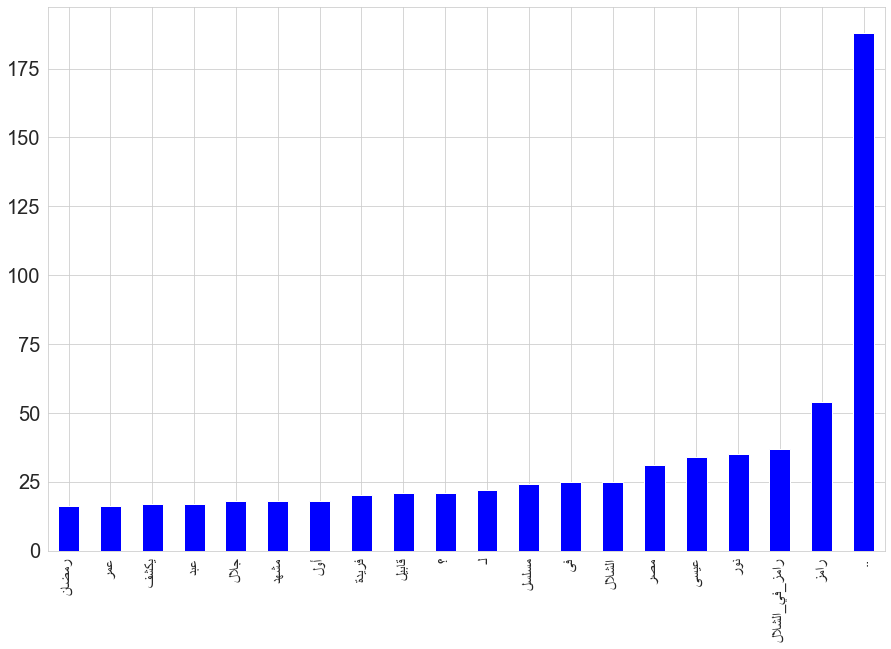

In [43]:
word_plot(popular_words,'blue')

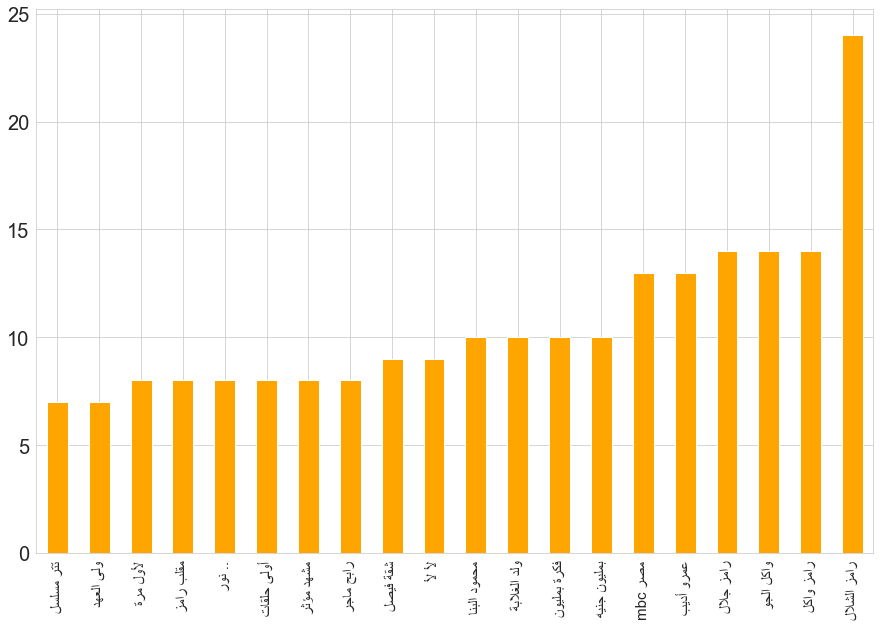

In [44]:
word_plot(popular_bigrams,'orange')

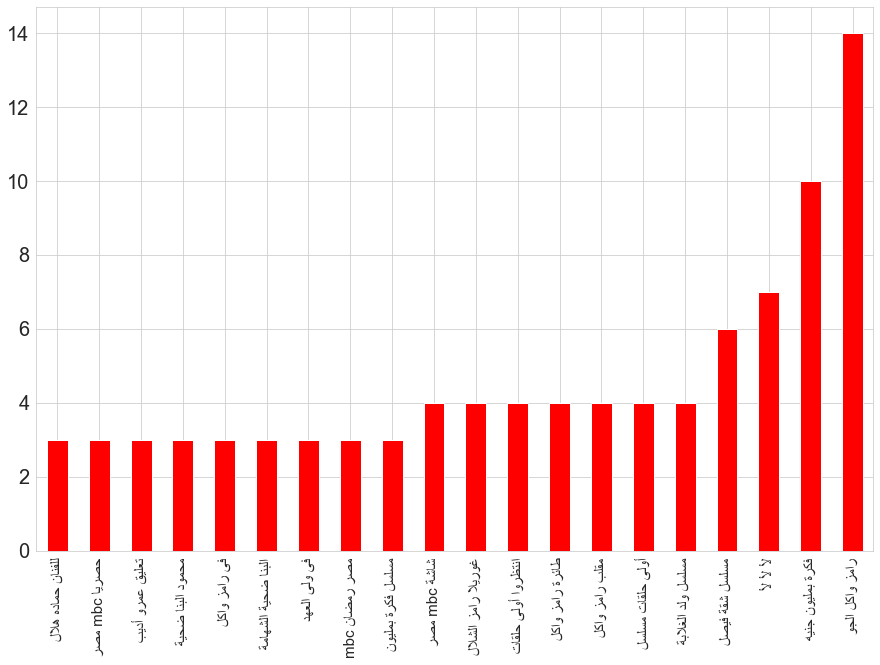

In [45]:
word_plot(popular_trigrams,'red')

# TfidfVectorizer
Trying to get words that are distinctive

In [46]:
word_vectorizer = TfidfVectorizer(
    sublinear_tf=True,
    strip_accents='unicode',
    analyzer='word',
    token_pattern=r'\w{1,}',
    stop_words=sw.words('arabic'),
    ngram_range=(1, 1),
    max_features=10000)
word_vectorizer.fit(df_unique.v_title)
word_features = word_vectorizer.transform(df_unique.v_title)

classifier_popular = LogisticRegression(C=0.1, solver='sag')
classifier_popular.fit(word_features ,df_unique.popular)


LogisticRegression(C=0.1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='sag', tol=0.0001, verbose=0,
                   warm_start=False)

In [47]:
names=['normal','popular']
c_tf = make_pipeline( word_vectorizer,classifier_popular)
explainer_tf = LimeTextExplainer(class_names=names)

exp = explainer_tf.explain_instance(df_unique.v_title.iloc[33], c_tf.predict_proba, num_features=4, top_labels=1)
exp.show_in_notebook(text=df_unique.v_title.iloc[33])

In [48]:
exp = explainer_tf.explain_instance(df_unique.v_title.iloc[45], c_tf.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(text=df_unique.v_title.iloc[45])

In [49]:
exp = explainer_tf.explain_instance(df_unique.v_title.iloc[1000], c_tf.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(text=df_unique.v_title.iloc[1000])

# Entertainment

In [50]:
vectorizer_Entertainment_title = CountVectorizer(min_df=5, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
Entertainment_title_vectorized = vectorizer_Entertainment_title.fit_transform(df_unique[df_unique.category=='Entertainment'].v_title)
lda_popular_Entertainment_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
Entertainment_title_vectorized_lda = lda_popular_Entertainment_title_vectorized.fit_transform(Entertainment_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_Entertainment_title_vectorized,Entertainment_title_vectorized, vectorizer_Entertainment_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=               x          y  topics  cluster       Freq
topic                                                  
2      35.672928 -26.407673       1        1  18.122096
6      20.736252 -23.790770       2        1  16.226845
5      11.024456 -35.418442       3        1  14.625341
0      40.866219 -40.630741       4        1  14.231578
3      31.151810 -52.242935       5        1  14.105543
1      25.946396 -38.023571       6        1  12.926824
4      16.231010 -49.641167       7        1   9.761773, topic_info=    Category        Freq     Term       Total  loglift  logprob
574  Default  148.000000     رامز  148.000000  30.0000  30.0000
16   Default  123.000000     أحمد  123.000000  29.0000  29.0000
707  Default  117.000000     عمرو  117.000000  28.0000  28.0000
248  Default  111.000000   الشلال  111.000000  27.0000  27.0000
18   Default   98.000000     أديب   98.000000  26.0000  26.0000
..       ...         ...      ...         ...      ...      ...
522   Topic7   20.800962      حسن   32.835084   1.8702  -4.1800
183   Topic7   46.947170  الحكاية  219.805647   0.7830  -3.3659
746   Topic7   23.555166    قابيل   62.020877   1.3586  -4.0556
870   Topic7   27.082834      مصر  246.769175   0.1171  -3.9161
1     Topic7   12.750280      آدم   28.752421   1.5135  -4.6694

[322 rows x 6 columns], token_table=      Topic      Freq   Term
term                        
1         3  0.313017    آدم
1         6  0.243458    آدم
1         7  0.452136    آدم
4         4  0.949418     آل
8         7  0.929078  أبطال
...     ...       ...    ...
998       7  0.013810   يكشف
1005      7  0.961196   يوسف
1006      3  0.960524   يوضح
1007      4  0.905405    يوم
1008      5  0.938992   يونس

[372 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 7, 6, 1, 4, 2, 5])

# Film & Animation

In [51]:
vectorizer_FilmAndAnimation_title = CountVectorizer(min_df=5, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
FilmAndAnimation_title_vectorized = vectorizer_FilmAndAnimation_title.fit_transform(df_unique[df_unique.category=='Film & Animation'].v_title)
lda_popular_FilmAndAnimation_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
FilmAndAnimation_title_vectorized_lda = lda_popular_FilmAndAnimation_title_vectorized.fit_transform(FilmAndAnimation_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_FilmAndAnimation_title_vectorized,FilmAndAnimation_title_vectorized, vectorizer_FilmAndAnimation_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
2      -68.942070  -89.549698       1        1  16.837314
3      143.785278  -25.695839       2        1  16.817310
1       55.855164 -119.034042       3        1  15.437392
0       18.989042    3.785624       4        1  14.669046
4      106.919273   97.123108       5        1  13.703194
6     -105.807785   33.268963       6        1  13.214326
5      -17.877403  126.604813       7        1   9.321419, topic_info=   Category       Freq   Term      Total  loglift  logprob
43  Default  28.000000    مصر  28.000000  30.0000  30.0000
20  Default  17.000000   رامز  17.000000  29.0000  29.0000
12  Default  14.000000  النار  14.000000  28.0000  28.0000
46  Default  14.000000  ممالك  14.000000  27.0000  27.0000
44  Default   9.000000  مصطفى   9.000000  26.0000  26.0000
..      ...        ...    ...        ...      ...      ...
0    Topic7   0.296624   أحمد  10.858044  -1.2273  -5.0327
16   Topic7   0.252904   جلال   7.999924  -1.0813  -5.1922
43   Topic7   0.344388    مصر  28.835865  -2.0548  -4.8834
13   Topic7   0.237522   بسبب   8.466382  -1.2007  -5.2550
46   Topic7   0.243415  ممالك  14.502369  -1.7144  -5.2304

[293 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
0         2  0.184195  أحمد
0         6  0.644683  أحمد
1         3  0.673898  أشرف
2         3  0.822267   أول
3         1  0.123548  إزاي
...     ...       ...   ...
51        1  0.863840  يحدث
52        3  0.165887  يكشف
52        4  0.414718  يكشف
52        5  0.248831  يكشف
52        6  0.082944  يكشف

[102 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 4, 2, 1, 5, 7, 6])

# Autos & Vehicles

In [52]:
vectorizer_AutosAndVehicles_title = CountVectorizer(min_df=1, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
AutosAndVehicles_title_vectorized = vectorizer_AutosAndVehicles_title.fit_transform(df_unique[df_unique.category=='Autos & Vehicles'].v_title)
lda_popular_AutosAndVehicles_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
AutosAndVehicles_title_vectorized_lda = lda_popular_AutosAndVehicles_title_vectorized.fit_transform(AutosAndVehicles_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_AutosAndVehicles_title_vectorized,AutosAndVehicles_title_vectorized, vectorizer_AutosAndVehicles_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
5     -128.622467  -73.280937       1        1  38.048919
3      193.914963   47.317074       2        1  32.505917
4       61.060371  156.831711       3        1  23.853397
0       32.646267  -12.981476       4        1   1.397975
1        4.232855 -182.794159       5        1   1.397972
2      165.501938 -122.495544       6        1   1.397952
6     -100.208847   96.531944       7        1   1.397868, topic_info=   Category      Freq     Term     Total  loglift  logprob
1   Default  1.000000     أمني  1.000000  30.0000  30.0000
24  Default  1.000000      طعن  1.000000  29.0000  29.0000
35  Default  1.000000      مصر  1.000000  28.0000  28.0000
21  Default  1.000000    شابين  1.000000  27.0000  27.0000
13  Default  1.000000  الوزراء  1.000000  26.0000  26.0000
..      ...       ...      ...       ...      ...      ...
21   Topic7  0.014457    شابين  1.084131  -0.0471  -3.7040
11   Topic7  0.013839   المصري  1.041119  -0.0504  -3.7477
24   Topic7  0.014193      طعن  1.073073  -0.0553  -3.7225
39   Topic7  0.014064     يحدث  1.071096  -0.0626  -3.7316
19   Topic7  0.014018     رئيس  1.264161  -0.2316  -3.7349

[261 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
0         2  0.978380     أتعمد
1         1  0.940603      أمني
7         1  0.973853   الشرقية
8         1  0.925763   الفيديو
9         2  1.026905     الكأس
10        1  1.022253  المتداول
11        2  0.960505    المصري
12        1  0.949076   الواقعة
13        2  0.954641   الوزراء
16        2  1.005603       حفل
17        1  0.939441     حقيقة
18        2  0.986633      خلال
19        2  0.791039      رئيس
20        2  0.965510      رياض
21        1  0.922397     شابين
23        1  0.975993       صحة
24        1  0.931903       طعن
25        1  0.958931     طومان
26        2  0.990615       عدم
29        1  0.918358        لـ
30        2  1.014465     للشعب
31        1  0.957334     لمقتل
32        2  1.001376      محرز
33        2  0.979894    مصافحة
34        1  0.988001      مصدر
35        1  0.929881       مصر
36        2  0.970384    معتذرا
38        1  0.969008     ويكشف
39        1  0.933623      يحدث
40        1  0.938208      ينفي, R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 4, 5, 1, 2, 3, 7])

# Comedy

In [53]:
vectorizer_Comedy_title = CountVectorizer(min_df=1, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
Comedy_title_vectorized = vectorizer_Comedy_title.fit_transform(df_unique[df_unique.category=='Comedy'].v_title)
lda_popular_Comedy_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
Comedy_title_vectorized_lda = lda_popular_Comedy_title_vectorized.fit_transform(Comedy_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_Comedy_title_vectorized,Comedy_title_vectorized, vectorizer_Comedy_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=               x          y  topics  cluster       Freq
topic                                                  
5     -45.625648 -36.582008       1        1  41.254310
6     -15.272071 -79.383003       2        1  30.154556
1      28.507650  15.990972       3        1  14.601393
0      36.971802 -74.495163       4        1   3.497594
3     -23.735407  11.105265       5        1   3.497552
4      58.861668 -26.808582       6        1   3.497316
2       6.618098 -31.695400       7        1   3.497278, topic_info=   Category      Freq      Term     Total  loglift  logprob
7   Default  0.000000     قاتلك  0.000000  12.0000  12.0000
11  Default  1.000000    وحقيقة  1.000000  11.0000  11.0000
5   Default  1.000000     خرافة  1.000000  10.0000  10.0000
8   Default  0.000000     محالة  0.000000   9.0000   9.0000
3   Default  1.000000     بتغسل  1.000000   8.0000   8.0000
..      ...       ...       ...       ...      ...      ...
2    Topic7  0.033792  المواعين  1.027132  -0.0611  -2.5193
3    Topic7  0.035161     بتغسل  1.070230  -0.0625  -2.4795
4    Topic7  0.031874    تتجوزي  0.975072  -0.0675  -2.5777
5    Topic7  0.033328     خرافة  1.080643  -0.1257  -2.5331
10   Topic7  0.032600      وانت  1.058847  -0.1275  -2.5552

[96 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
0         1  0.929150    الفطار
2         1  0.973585  المواعين
3         1  0.934379     بتغسل
5         1  0.925375     خرافة
10        1  0.944423      وانت
11        1  0.942428    وحقيقة, R=12, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 7, 2, 1, 4, 5, 3])

In [54]:
vectorizer_Music_title = CountVectorizer(min_df=5, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
Music_title_vectorized = vectorizer_Music_title.fit_transform(df_unique[df_unique.category=='Music'].v_title)
lda_popular_Music_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
Music_title_vectorized_lda = lda_popular_Music_title_vectorized.fit_transform(Music_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_Music_title_vectorized,Music_title_vectorized, vectorizer_Music_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=               x           y  topics  cluster       Freq
topic                                                   
0      17.929367 -112.644226       1        1  41.468053
1     -52.196449  -33.467915       2        1  26.852756
2      -6.484458    7.018736       3        1  16.063149
3       5.722206  -52.812778       4        1   3.905997
4      63.641270  -72.157700       5        1   3.905695
5      51.434204  -12.325933       6        1   3.902560
6     -39.989864  -93.299194       7        1   3.901790, topic_info=  Category       Freq       Term      Total  loglift  logprob
1  Default  12.000000      البدر  12.000000   6.0000   6.0000
3  Default  14.000000         بن  14.000000   5.0000   5.0000
2  Default  15.000000        بدر  15.000000   4.0000   4.0000
5  Default   9.000000       ليلة   9.000000   3.0000   3.0000
0  Default   8.000000     الأمير   8.000000   2.0000   2.0000
4  Default  11.000000  عبدالمحسن  11.000000   1.0000   1.0000
5   Topic1   7.229779       ليلة   9.984930   0.5574  -1.4320
4   Topic1   6.713482  عبدالمحسن  11.636605   0.3302  -1.5061
3   Topic1   7.503367         بن  14.979470   0.1889  -1.3949
2   Topic1   7.310096        بدر  15.237668   0.1457  -1.4210
0   Topic1   0.926386     الأمير   8.226578  -1.3036  -3.4867
1   Topic1   0.588570      البدر  12.934748  -2.2097  -3.9403
0   Topic2   5.072641     الأمير   8.226578   0.8313  -1.3518
3   Topic2   4.910019         بن  14.979470   0.1994  -1.3844
2   Topic2   4.873524        بدر  15.237668   0.1748  -1.3918
4   Topic2   2.623226  عبدالمحسن  11.636605  -0.1749  -2.0113
1   Topic2   1.475576      البدر  12.934748  -0.8561  -2.5866
5   Topic2   0.647526       ليلة   9.984930  -1.4209  -3.4103
1   Topic3   8.808026      البدر  12.934748   1.4444  -0.2862
2   Topic3   0.960417        بدر  15.237668  -0.9355  -2.5022
0   Topic3   0.483379     الأمير   8.226578  -1.0057  -3.1888
4   Topic3   0.525493  عبدالمحسن  11.636605  -1.2689  -3.1052
5   Topic3   0.440774       ليلة   9.984930  -1.2917  -3.2810
3   Topic3   0.508009         بن  14.979470  -1.5553  -3.1391
2   Topic4   0.747186        بدر  15.237668   0.2274  -1.3392
0   Topic4   0.393600     الأمير   8.226578   0.2029  -1.9802
3   Topic4   0.619411         بن  14.979470   0.0570  -1.5268
5   Topic4   0.389421       ليلة   9.984930  -0.0015  -1.9909
4   Topic4   0.377221  عبدالمحسن  11.636605  -0.1864  -2.0227
1   Topic4   0.324538      البدر  12.934748  -0.4426  -2.1732
0   Topic5   0.415160     الأمير   8.226578   0.2563  -1.9268
1   Topic5   0.574333      البدر  12.934748   0.1283  -1.6023
4   Topic5   0.487980  عبدالمحسن  11.636605   0.0711  -1.7652
3   Topic5   0.536679         بن  14.979470  -0.0863  -1.6701
5   Topic5   0.341858       ليلة   9.984930  -0.1317  -2.1211
2   Topic5   0.495147        بدر  15.237668  -0.1839  -1.7506
1   Topic6   0.712590      البدر  12.934748   0.3448  -1.3858
0   Topic6   0.412336     الأمير   8.226578   0.2503  -1.9328
5   Topic6   0.455971       ليلة   9.984930   0.1571  -1.8322
4   Topic6   0.413526  عبدالمحسن  11.636605  -0.0937  -1.9300
2   Topic6   0.435752        بدر  15.237668  -0.3109  -1.8776
3   Topic6   0.418694         بن  14.979470  -0.3338  -1.9175
0   Topic7   0.523077     الأمير   8.226578   0.4883  -1.6948
5   Topic7   0.479601       ليلة   9.984930   0.2079  -1.7815
4   Topic7   0.495676  عبدالمحسن  11.636605   0.0877  -1.7486
1   Topic7   0.451115      البدر  12.934748  -0.1122  -1.8428
3   Topic7   0.483292         بن  14.979470  -0.1901  -1.7739
2   Topic7   0.415546        بدر  15.237668  -0.3582  -1.9249, token_table=      Topic      Freq       Term
term                            
0         1  0.121557     الأمير
0         2  0.607786     الأمير
0         7  0.121557     الأمير
1         1  0.077311      البدر
1         2  0.077311      البدر
1         3  0.695800      البدر
1         5  0.077311      البدر
1         6  0.077311      البدر
2         1  0.459388        بدر
2         2  0.328134        ب

# Music

In [55]:
vectorizer_Sports_title = CountVectorizer(min_df=5, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
Sports_title_vectorized = vectorizer_Sports_title.fit_transform(df_unique[df_unique.category=='Sports'].v_title)
lda_popular_Sports_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
Sports_title_vectorized_lda = lda_popular_Sports_title_vectorized.fit_transform(Sports_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_Sports_title_vectorized,Sports_title_vectorized, vectorizer_Sports_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=               x          y  topics  cluster       Freq
topic                                                  
4     -52.483643  71.574783       1        1  25.200301
1     -19.373260   5.706587       2        1  15.048916
3     -59.861519 -55.901730       3        1  14.496453
0      13.736897 -60.161640       4        1  14.078694
6      21.115078  67.315025       5        1  11.800002
2     -92.971870   9.966459       6        1  11.088713
5      54.225285   1.446833       7        1   8.286922, topic_info=   Category       Freq     Term      Total  loglift  logprob
15  Default   8.000000     خالد   8.000000  29.0000  29.0000
4   Default   9.000000   إكرامي   9.000000  28.0000  28.0000
18  Default   9.000000     شريف   9.000000  27.0000  27.0000
0   Default   7.000000     أحمد   7.000000  26.0000  26.0000
20  Default  10.000000      عبد  10.000000  25.0000  25.0000
..      ...        ...      ...        ...      ...      ...
28   Topic7   0.421222     يكشف   8.765171  -0.5449  -3.8208
3    Topic7   0.440095  إفريقيا  10.232151  -0.6558  -3.7770
4    Topic7   0.380182   إكرامي   9.107764  -0.6857  -3.9234
20   Topic7   0.364708      عبد  10.100206  -0.8307  -3.9649
25   Topic7   0.405837      مصر  14.875264  -1.1110  -3.8580

[232 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
0         1  0.134562  أحمد
0         2  0.134562  أحمد
0         5  0.538249  أحمد
0         7  0.134562  أحمد
1         1  0.507783  أداء
...     ...       ...   ...
28        2  0.114088  يكشف
28        3  0.228176  يكشف
28        4  0.114088  يكشف
28        5  0.114088  يكشف
28        6  0.114088  يكشف

[117 rows x 3 columns], R=29, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 2, 4, 1, 7, 3, 6])

# News & Politics

In [56]:
vectorizer_NewsAndPolitics_title = CountVectorizer(min_df=5, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
NewsAndPolitics_title_vectorized = vectorizer_NewsAndPolitics_title.fit_transform(df_unique[df_unique.category=='News & Politics'].v_title)
lda_popular_NewsAndPolitics_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
NewsAndPolitics_title_vectorized_lda = lda_popular_NewsAndPolitics_title_vectorized.fit_transform(NewsAndPolitics_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_NewsAndPolitics_title_vectorized,NewsAndPolitics_title_vectorized, vectorizer_NewsAndPolitics_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=               x           y  topics  cluster       Freq
topic                                                   
4     -16.572477 -128.093155       1        1  33.791419
5     -59.036770   18.014103       2        1  33.179039
3      67.782547 -103.576210       3        1  14.893356
0     -79.982117  -67.297905       4        1   4.535332
1      88.727905  -18.264236       5        1   4.533737
2       4.372874  -42.781082       6        1   4.533697
6      25.318241   42.530972       7        1   4.533419, topic_info=  Category      Freq  Term     Total  loglift  logprob
2  Default  8.000000  عمرو  8.000000   6.0000   6.0000
1  Default  7.000000  أديب  7.000000   5.0000   5.0000
4  Default  4.000000   مصر  4.000000   4.0000   4.0000
0  Default  7.000000  أحمد  7.000000   3.0000   3.0000
3  Default  6.000000  محمد  6.000000   2.0000   2.0000
5  Default  6.000000  مكرم  6.000000   1.0000   1.0000
1   Topic1  5.868977  أديب  7.863017   0.7925  -0.8589
2   Topic1  5.982151  عمرو  8.220984   0.7671  -0.8398
4   Topic1  0.472314   مصر  4.839120  -1.2419  -3.3787
5   Topic1  0.519640  مكرم  6.112135  -1.3799  -3.2832
3   Topic1  0.522930  محمد  6.885710  -1.4928  -3.2769
0   Topic1  0.488469  أحمد  7.079034  -1.5887  -3.3451
3   Topic2  4.425664  محمد  6.885710   0.6612  -1.1229
5   Topic2  3.781662  مكرم  6.112135   0.6231  -1.2802
0   Topic2  3.751596  أحمد  7.079034   0.4683  -1.2881
4   Topic2  0.554212   مصر  4.839120  -1.0637  -3.2005
2   Topic2  0.604910  عمرو  8.220984  -1.5061  -3.1130
1   Topic2  0.485362  أديب  7.863017  -1.6818  -3.3332
4   Topic3  2.649899   مصر  4.839120   1.3020  -0.8348
0   Topic3  1.421756  أحمد  7.079034   0.2990  -1.4574
3   Topic3  0.713487  محمد  6.885710  -0.3628  -2.1469
5   Topic3  0.624018  مكرم  6.112135  -0.3776  -2.2809
1   Topic3  0.350989  أديب  7.863017  -1.2049  -2.8563
2   Topic3  0.346128  عمرو  8.220984  -1.2634  -2.8703
0   Topic4  0.407535  أحمد  7.079034   0.2385  -1.5179
4   Topic4  0.270017   مصر  4.839120   0.2073  -1.9296
5   Topic4  0.302039  مكرم  6.112135   0.0858  -1.8175
3   Topic4  0.284844  محمد  6.885710  -0.0920  -1.8761
1   Topic4  0.301932  أديب  7.863017  -0.1665  -1.8179
2   Topic4  0.293118  عمرو  8.220984  -0.2406  -1.8475
4   Topic5  0.292495   مصر  4.839120   0.2876  -1.8493
0   Topic5  0.344049  أحمد  7.079034   0.0695  -1.6869
5   Topic5  0.286172  مكرم  6.112135   0.0322  -1.8711
3   Topic5  0.316317  محمد  6.885710   0.0132  -1.7710
2   Topic5  0.329009  عمرو  8.220984  -0.1247  -1.7316
1   Topic5  0.290790  أديب  7.863017  -0.2037  -1.8551
4   Topic6  0.287193   مصر  4.839120   0.2693  -1.8675
0   Topic6  0.354620  أحمد  7.079034   0.0998  -1.6566
3   Topic6  0.330815  محمد  6.885710   0.0580  -1.7261
5   Topic6  0.271155  مكرم  6.112135  -0.0217  -1.9250
2   Topic6  0.319251  عمرو  8.220984  -0.1548  -1.7617
1   Topic6  0.295781  أديب  7.863017  -0.1867  -1.8381
4   Topic7  0.312990   مصر  4.839120   0.3554  -1.7815
5   Topic7  0.327448  مكرم  6.112135   0.1670  -1.7363
0   Topic7  0.311010  أحمد  7.079034  -0.0314  -1.7878
3   Topic7  0.291653  محمد  6.885710  -0.0679  -1.8521
2   Topic7  0.346416  عمرو  8.220984  -0.0731  -1.6800
1   Topic7  0.269184  أديب  7.863017  -0.2808  -1.9322, token_table=      Topic      Freq  Term
term                       
0         2  0.565049  أحمد
0         3  0.141262  أحمد
1         1  0.763066  أديب
2         1  0.729840  عمرو
2         2  0.121640  عمرو
3         1  0.145228  محمد
3         2  0.580913  محمد
3         3  0.145228  محمد
4         2  0.206649   مصر
4         3  0.619947   مصر
5         1  0.163609  مكرم
5         2  0.654436  مكرم
5         3  0.163609  مكرم, R=6, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 6, 4, 1, 2, 3, 7])

In [57]:
#People & Blogs

In [58]:
vectorizer_PeopleAndBlogs_title = CountVectorizer(min_df=2, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
PeopleAndBlogs_title_vectorized = vectorizer_PeopleAndBlogs_title.fit_transform(df_unique[df_unique.category=='People & Blogs'].v_title)
lda_popular_PeopleAndBlogs_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
PeopleAndBlogs_title_vectorized_lda = lda_popular_PeopleAndBlogs_title_vectorized.fit_transform(PeopleAndBlogs_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_PeopleAndBlogs_title_vectorized,PeopleAndBlogs_title_vectorized, vectorizer_PeopleAndBlogs_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=               x           y  topics  cluster       Freq
topic                                                   
0      17.731792   73.830437       1        1  67.690930
3      10.588874 -112.524109       2        1  13.708335
4     -68.319237  -62.842472       3        1   3.720571
1      14.160302  -19.346806       4        1   3.720333
2      96.639862   24.148844       5        1   3.720004
6     -64.747734   30.334776       6        1   3.719930
5      93.068398  -69.028397       7        1   3.719896, topic_info=  Category      Freq       Term     Total  loglift  logprob
0  Default  2.000000  المعلومات  2.000000   5.0000   5.0000
4  Default  2.000000     وتأمين  2.000000   4.0000   4.0000
2  Default  2.000000       خبير  2.000000   3.0000   3.0000
1  Default  2.000000      تقنية  2.000000   2.0000   2.0000
3  Default  1.000000       محمد  1.000000   1.0000   1.0000
2   Topic1  1.554023       خبير  2.078396   0.0995  -1.4715
1   Topic1  1.609020      تقنية  2.157864   0.0967  -1.4367
4   Topic1  1.611030     وتأمين  2.164779   0.0948  -1.4355
0   Topic1  1.549154  المعلومات  2.120171   0.0764  -1.4747
3   Topic1  0.445865       محمد  1.478790  -0.8087  -2.7201
3   Topic2  0.659364       محمد  1.478790   1.1795  -0.7319
4   Topic2  0.189087     وتأمين  2.164779  -0.4507  -1.9810
1   Topic2  0.186357      تقنية  2.157864  -0.4620  -1.9955
0   Topic2  0.177238  المعلومات  2.120171  -0.4946  -2.0457
2   Topic2  0.158788       خبير  2.078396  -0.5846  -2.1556
3   Topic3  0.077814       محمد  1.478790   0.3466  -1.5647
2   Topic3  0.076867       خبير  2.078396  -0.0060  -1.5770
0   Topic3  0.076661  المعلومات  2.120171  -0.0286  -1.5796
4   Topic3  0.074833     وتأمين  2.164779  -0.0735  -1.6038
1   Topic3  0.065881      تقنية  2.157864  -0.1977  -1.7312
3   Topic4  0.074322       محمد  1.478790   0.3008  -1.6106
4   Topic4  0.080609     وتأمين  2.164779   0.0009  -1.5294
1   Topic4  0.079393      تقنية  2.157864  -0.0111  -1.5446
0   Topic4  0.071564  المعلومات  2.120171  -0.0973  -1.6484
2   Topic4  0.066145       خبير  2.078396  -0.1561  -1.7271
3   Topic5  0.072733       محمد  1.478790   0.2793  -1.6321
0   Topic5  0.083234  المعلومات  2.120171   0.0538  -1.4972
2   Topic5  0.077224       خبير  2.078396  -0.0012  -1.5722
1   Topic5  0.075468      تقنية  2.157864  -0.0617  -1.5952
4   Topic5  0.063342     وتأمين  2.164779  -0.2401  -1.7704
3   Topic6  0.074505       محمد  1.478790   0.3034  -1.6080
0   Topic6  0.083067  المعلومات  2.120171   0.0519  -1.4992
1   Topic6  0.076335      تقنية  2.157864  -0.0503  -1.5837
2   Topic6  0.072890       خبير  2.078396  -0.0589  -1.6299
4   Topic6  0.065196     وتأمين  2.164779  -0.2112  -1.7415
3   Topic7  0.074186       محمد  1.478790   0.2991  -1.6123
0   Topic7  0.079252  المعلومات  2.120171   0.0049  -1.5462
4   Topic7  0.080682     وتأمين  2.164779   0.0019  -1.5283
2   Topic7  0.072460       خبير  2.078396  -0.0648  -1.6358
1   Topic7  0.065410      تقنية  2.157864  -0.2047  -1.7382, token_table=      Topic      Freq       Term
term                            
0         1  0.943320  المعلومات
1         1  0.926843      تقنية
2         1  0.962280       خبير
3         2  0.676229       محمد
4         1  0.923882     وتأمين, R=5, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 4, 5, 2, 3, 7, 6])

In [59]:
vectorizer_TravelAndEvents_title = CountVectorizer(min_df=2, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
TravelAndEvents_title_vectorized = vectorizer_TravelAndEvents_title.fit_transform(df_unique[df_unique.category=='Travel & Events'].v_title)
lda_popular_TravelAndEvents_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
TravelAndEvents_title_vectorized_lda = lda_popular_TravelAndEvents_title_vectorized.fit_transform(TravelAndEvents_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_TravelAndEvents_title_vectorized,TravelAndEvents_title_vectorized, vectorizer_TravelAndEvents_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
0       28.669670  130.530365       1        1  50.830512
5      -97.036507   90.539406       2        1  19.765897
4       97.940308  -87.199188       3        1  19.765850
6        0.454147    1.670186       4        1   2.409524
3     -125.250252  -38.321186       5        1   2.409507
1      126.158913   41.663033       6        1   2.409450
2      -27.766340 -127.191597       7        1   2.409260, topic_info=   Category      Freq       Term     Total  loglift  logprob
5   Default  2.000000      عرفات  2.000000   9.0000   9.0000
8   Default  2.000000  والمسلمين  2.000000   8.0000   8.0000
6   Default  2.000000       لبيك  2.000000   7.0000   7.0000
1   Default  2.000000    الدكتور  2.000000   6.0000   6.0000
2   Default  2.000000      الشيخ  2.000000   5.0000   5.0000
..      ...       ...        ...       ...      ...      ...
5    Topic7  0.068021      عرفات  2.839507  -0.0057  -2.1401
1    Topic7  0.065986    الدكتور  2.917057  -0.0630  -2.1705
6    Topic7  0.063489       لبيك  2.885079  -0.0906  -2.2091
4    Topic7  0.063539       صعيد  2.944228  -0.1101  -2.2083
2    Topic7  0.060757      الشيخ  2.968933  -0.1632  -2.2531

[72 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
0         1  0.816321       أحمد
1         1  0.685623    الدكتور
1         3  0.342811    الدكتور
2         1  0.673643      الشيخ
2         3  0.336821      الشيخ
3         2  0.488436      اللهم
3         3  0.488436      اللهم
4         1  0.679295       صعيد
4         2  0.339648       صعيد
5         1  0.704348      عرفات
5         2  0.352174      عرفات
6         2  0.346611       لبيك
6         3  0.346611       لبيك
7         1  0.818851     للحجاج
8         1  0.798281  والمسلمين, R=9, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 6, 5, 7, 4, 2, 3])

In [60]:
#Howto & Style

In [61]:
vectorizer_HowtoAndStyle_title = CountVectorizer(min_df=1, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
HowtoAndStyle_title_vectorized = vectorizer_HowtoAndStyle_title.fit_transform(df_unique[df_unique.category=='Howto & Style'].v_title)
lda_popular_HowtoAndStyle_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
HowtoAndStyle_title_vectorized_lda = lda_popular_HowtoAndStyle_title_vectorized.fit_transform(HowtoAndStyle_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_HowtoAndStyle_title_vectorized,HowtoAndStyle_title_vectorized, vectorizer_HowtoAndStyle_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
3      111.733582  -25.774498       1        1  49.144296
0      -43.653717   76.528755       2        1  43.327847
2     -102.718414  -13.184137       3        1   1.505629
5      -54.557194 -109.192131       4        1   1.505604
4       63.572266   70.233437       5        1   1.505563
1       52.668774 -115.487297       6        1   1.505541
6        4.507524  -19.479321       7        1   1.505520, topic_info=   Category      Freq      Term     Total  loglift  logprob
3   Default  1.000000   السرطان  1.000000  17.0000  17.0000
0   Default  1.000000  الأورمان  1.000000  16.0000  16.0000
4   Default  1.000000  السوشيال  1.000000  15.0000  15.0000
6   Default  1.000000      جولة  1.000000  14.0000  14.0000
2   Default  1.000000   الحكاية  1.000000  13.0000  13.0000
..      ...       ...       ...       ...      ...      ...
9    Topic7  0.014632       شفا  1.027708  -0.0559  -2.8617
7    Topic7  0.013683       خلط  0.967573  -0.0626  -2.9288
14   Topic7  0.013204   ممارسات  0.960019  -0.0904  -2.9644
5    Topic7  0.014423   بالصعيد  1.073108  -0.1134  -2.8761
3    Topic7  0.014737   السرطان  1.110544  -0.1262  -2.8546

[136 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
0         1  0.972755   الأورمان
1         2  1.027864    الإعلام
2         1  0.983338    الحكاية
3         1  0.900460    السرطان
4         2  0.986558   السوشيال
5         1  0.931873    بالصعيد
6         1  0.973710       جولة
7         2  1.033513        خلط
8         1  0.990343       داخل
9         1  0.973039        شفا
10        2  0.963919  عبدالرحمن
11        1  1.028549      لعلاج
12        2  1.125665       محمد
13        1  1.021701     مستشفى
14        2  1.041646    ممارسات
15        2  1.055348      ميديا
16        2  1.032550     ووسائل, R=17, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 1, 3, 6, 5, 2, 7])

# Play Lists

In [62]:
#MBCMASR

In [63]:
vectorizer_MBCMASR_title = CountVectorizer(min_df=5, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
MBCMASR_title_vectorized = vectorizer_MBCMASR_title.fit_transform(df_unique[df_unique.ply_lst_title=='MBCMASR'].v_title)
lda_popular_MBCMASR_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
MBCMASR_title_vectorized_lda = lda_popular_MBCMASR_title_vectorized.fit_transform(MBCMASR_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_MBCMASR_title_vectorized,MBCMASR_title_vectorized, vectorizer_MBCMASR_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
0      -98.824272  -55.704994       1        1  18.533883
1       32.817085   88.658089       2        1  14.114813
6      -15.476062 -131.707596       3        1  13.842301
5        8.670795  -21.524891       4        1  13.836958
3      116.165596   12.655156       5        1  13.814869
2      -74.677704   54.477875       6        1  13.381883
4       92.018890  -97.528183       7        1  12.475291, topic_info=     Category        Freq    Term       Total  loglift  logprob
1011  Default  318.000000     مصر  318.000000  30.0000  30.0000
822   Default  135.000000    عمرو  135.000000  29.0000  29.0000
18    Default  153.000000    أحمد  153.000000  28.0000  28.0000
21    Default  111.000000    أديب  111.000000  27.0000  27.0000
245   Default   91.000000  الرياض   91.000000  26.0000  26.0000
...       ...         ...     ...         ...      ...      ...
868    Topic7   24.197336     قبل   36.631636   1.6668  -4.4611
978    Topic7   53.966078    محمد  202.714132   0.7580  -3.6589
776    Topic7   20.511396    طارق   46.663814   1.2594  -4.6263
821    Topic7   15.510710     عمر   30.061708   1.4197  -4.9058
1167   Topic7   15.204136    يكشف  170.870213  -0.3379  -4.9257

[312 rows x 6 columns], token_table=      Topic      Freq   Term
term                        
0         5  0.962886    آخر
4         5  0.977371     آل
10        2  0.979693    أبو
14        1  0.047426  أثناء
14        3  0.948517  أثناء
...     ...       ...    ...
1167      6  0.292620   يكشف
1167      7  0.087786   يكشف
1168      5  0.961483   يكون
1177      3  0.938353   يوسف
1179      3  0.960158    يوم

[356 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 7, 6, 4, 3, 5])

# MBC THE VOICE الموسم الخامس

In [64]:
vectorizer_THE_VOICE_title = CountVectorizer(min_df=5, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
THE_VOICE_title_vectorized = vectorizer_THE_VOICE_title.fit_transform(df_unique[df_unique.ply_lst_title=='MBC THE VOICE الموسم الخامس'].v_title)
lda_popular_THE_VOICE_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
THE_VOICE_title_vectorized_lda = lda_popular_THE_VOICE_title_vectorized.fit_transform(THE_VOICE_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_THE_VOICE_title_vectorized,THE_VOICE_title_vectorized, vectorizer_THE_VOICE_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
6     -193.341904  -15.932905       1        1  14.285714
5      -83.926521 -165.575180       2        1  14.285714
4      100.372292 -145.643478       3        1  14.285714
3       65.846786  173.573654       4        1  14.285714
2      175.257233   23.929955       5        1  14.285714
1       -9.044515    4.001159       6        1  14.285714
0     -118.455109  153.645264       7        1  14.285714, topic_info=  Category      Freq  Term  Total  loglift  logprob
0  Default  5.000000  فريق    5.0      1.0      1.0
0   Topic1  0.714286  فريق    5.0      0.0      0.0
0   Topic2  0.714286  فريق    5.0      0.0      0.0
0   Topic3  0.714286  فريق    5.0      0.0      0.0
0   Topic4  0.714286  فريق    5.0      0.0      0.0
0   Topic5  0.714286  فريق    5.0      0.0      0.0
0   Topic6  0.714286  فريق    5.0      0.0      0.0
0   Topic7  0.714286  فريق    5.0      0.0      0.0, token_table=      Topic  Freq  Term
term                   
0         1   0.2  فريق
0         2   0.2  فريق
0         3   0.2  فريق
0         4   0.2  فريق
0         5   0.2  فريق
0         6   0.2  فريق
0         7   0.2  فريق, R=1, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 6, 5, 4, 3, 2, 1])

In [65]:
vectorizer_Ramadan_title = CountVectorizer(min_df=2, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
Ramadan_title_vectorized = vectorizer_Ramadan_title.fit_transform(df_unique[df_unique.ply_lst_title=='رمضان 2019'].v_title)
lda_popular_Ramadan_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
Ramadan_title_vectorized_lda = lda_popular_Ramadan_title_vectorized.fit_transform(Ramadan_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_Ramadan_title_vectorized,Ramadan_title_vectorized, vectorizer_Ramadan_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
1       58.201138  -72.514099       1        1  72.196357
5     -105.788277  -65.135605       2        1  13.885564
2       20.398687    0.339971       3        1   2.784473
4      -23.793644  -68.824875       4        1   2.783761
6      -67.985970 -137.989838       5        1   2.783690
3       14.008743 -141.678925       6        1   2.783410
0      -61.595974    4.029328       7        1   2.782746, topic_info=  Category      Freq    Term     Total  loglift  logprob
4  Default  2.000000     مصر  2.000000   5.0000   5.0000
2  Default  2.000000   رمضان  2.000000   4.0000   4.0000
3  Default  2.000000   مسلسل  2.000000   3.0000   3.0000
1  Default  2.000000  حصرياً  2.000000   2.0000   2.0000
0  Default  2.000000   برومو  2.000000   1.0000   1.0000
1   Topic1  1.778170  حصرياً  2.311391   0.0635  -1.5835
4   Topic1  1.743548     مصر  2.308606   0.0451  -1.6032
0   Topic1  1.719179   برومو  2.279255   0.0438  -1.6173
3   Topic1  1.734867   مسلسل  2.554781  -0.0613  -1.6082
2   Topic1  1.687798   رمضان  2.545967  -0.0853  -1.6357
2   Topic2  0.522405   رمضان  2.545967   0.3905  -1.1599
3   Topic2  0.486241   مسلسل  2.554781   0.3153  -1.2316
0   Topic2  0.233021   برومو  2.279255  -0.3062  -1.9672
4   Topic2  0.221018     مصر  2.308606  -0.3718  -2.0201
1   Topic2  0.203583  حصرياً  2.311391  -0.4552  -2.1023
0   Topic3  0.070563   برومو  2.279255   0.1060  -1.5550
1   Topic3  0.066148  حصرياً  2.311391   0.0274  -1.6197
4   Topic3  0.064288     مصر  2.308606   0.0001  -1.6482
2   Topic3  0.070043   رمضان  2.545967  -0.0120  -1.5624
3   Topic3  0.063095   مسلسل  2.554781  -0.1200  -1.6669
4   Topic4  0.071363     مصر  2.308606   0.1047  -1.5435
0   Topic4  0.064299   برومو  2.279255   0.0133  -1.6478
1   Topic4  0.064243  حصرياً  2.311391  -0.0016  -1.6486
2   Topic4  0.067536   رمضان  2.545967  -0.0482  -1.5986
3   Topic4  0.066610   مسلسل  2.554781  -0.0655  -1.6124
0   Topic5  0.068653   برومو  2.279255   0.0789  -1.5822
3   Topic5  0.076590   مسلسل  2.554781   0.0741  -1.4728
4   Topic5  0.069105     مصر  2.308606   0.0726  -1.5756
1   Topic5  0.061849  حصرياً  2.311391  -0.0395  -1.6866
2   Topic5  0.057846   رمضان  2.545967  -0.2031  -1.7535
4   Topic6  0.067485     مصر  2.308606   0.0490  -1.5993
0   Topic6  0.065766   برومو  2.279255   0.0360  -1.6251
1   Topic6  0.066459  حصرياً  2.311391   0.0325  -1.6146
2   Topic6  0.072860   رمضان  2.545967   0.0278  -1.5226
3   Topic6  0.061439   مسلسل  2.554781  -0.1462  -1.6931
4   Topic7  0.071800     مصر  2.308606   0.1112  -1.5371
1   Topic7  0.070939  حصرياً  2.311391   0.0980  -1.5491
2   Topic7  0.067478   رمضان  2.545967  -0.0487  -1.5991
3   Topic7  0.065939   مسلسل  2.554781  -0.0753  -1.6222
0   Topic7  0.057773   برومو  2.279255  -0.0933  -1.7544, token_table=      Topic      Freq    Term
term                         
0         1  0.877480   برومو
1         1  0.865280  حصرياً
2         1  0.785556   رمضان
2         2  0.392778   رمضان
3         1  0.782846   مسلسل
4         1  0.866324     مصر, R=5, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 6, 3, 5, 7, 4, 1])

# فكرة بمليون جنية

In [66]:
vectorizer_Fekra_title = CountVectorizer(min_df=5, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
Fekra_title_vectorized = vectorizer_Fekra_title.fit_transform(df_unique[df_unique.ply_lst_title=='فكرة بمليون جنية'].v_title)
lda_popular_Fekra_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
Fekra_title_vectorized_lda = lda_popular_Fekra_title_vectorized.fit_transform(Fekra_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_Fekra_title_vectorized,Fekra_title_vectorized, vectorizer_Fekra_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
1      110.087067  -49.970352       1        1  79.586701
5       58.777908 -118.193932       2        1   3.410057
4       25.349136  -39.647083       3        1   3.402288
2      -25.960104 -107.870613       4        1   3.400401
0       76.658348   28.576557       5        1   3.400396
3      -59.388855  -29.323784       6        1   3.400142
6       -8.079634   38.899750       7        1   3.400014, topic_info=  Category      Freq    Term     Total  loglift  logprob
1  Default  5.000000    جنيه  5.000000   3.0000   3.0000
0  Default  5.000000  بمليون  5.000000   2.0000   2.0000
2  Default  5.000000    فكرة  5.000000   1.0000   1.0000
2   Topic1  4.153161    فكرة  5.200262   0.0035  -1.1204
1   Topic1  4.466224    جنيه  5.593821   0.0032  -1.0477
0   Topic1  4.114488  بمليون  5.205917  -0.0070  -1.1298
1   Topic2  0.223495    جنيه  5.593821   0.1584  -0.8925
2   Topic2  0.175885    فكرة  5.200262  -0.0082  -1.1321
0   Topic2  0.146229  بمليون  5.205917  -0.1939  -1.3167
0   Topic3  0.193896  بمليون  5.205917   0.0905  -1.0323
2   Topic3  0.169771    فكرة  5.200262  -0.0413  -1.1652
1   Topic3  0.180699    جنيه  5.593821  -0.0519  -1.1028
0   Topic4  0.196356  بمليون  5.205917   0.1037  -1.0191
2   Topic4  0.186863    فكرة  5.200262   0.0552  -1.0687
1   Topic4  0.160845    جنيه  5.593821  -0.1677  -1.2186
0   Topic5  0.184901  بمليون  5.205917   0.0435  -1.0792
2   Topic5  0.177531    فكرة  5.200262   0.0040  -1.1199
1   Topic5  0.181632    جنيه  5.593821  -0.0462  -1.0971
1   Topic6  0.192456    جنيه  5.593821   0.0118  -1.0391
0   Topic6  0.177575  بمليون  5.205917   0.0032  -1.1196
2   Topic6  0.173992    فكرة  5.200262  -0.0161  -1.1400
0   Topic7  0.192473  بمليون  5.205917   0.0838  -1.0390
1   Topic7  0.188470    جنيه  5.593821  -0.0091  -1.0600
2   Topic7  0.163060    فكرة  5.200262  -0.0810  -1.2048, token_table=      Topic      Freq    Term
term                         
0         1  0.768356  بمليون
1         1  0.715075    جنيه
2         1  0.769192    فكرة, R=3, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 6, 5, 3, 1, 4, 7])

# شقة فيصل

In [67]:
vectorizer_Faisel_title = CountVectorizer(min_df=5, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
Faisel_title_vectorized = vectorizer_Faisel_title.fit_transform(df_unique[df_unique.ply_lst_title=='شقة فيصل'].v_title)
lda_popular_Faisel_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
Faisel_title_vectorized_lda = lda_popular_Faisel_title_vectorized.fit_transform(Faisel_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_Faisel_title_vectorized,Faisel_title_vectorized, vectorizer_Faisel_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
6     -193.341904  -15.932905       1        1  14.285714
5      -83.926521 -165.575180       2        1  14.285714
4      100.372292 -145.643478       3        1  14.285714
3       65.846786  173.573654       4        1  14.285714
2      175.257233   23.929955       5        1  14.285714
1       -9.044515    4.001159       6        1  14.285714
0     -118.455109  153.645264       7        1  14.285714, topic_info=  Category      Freq  Term  Total  loglift  logprob
0  Default  5.000000  ميزو    5.0      1.0      1.0
0   Topic1  0.857143  ميزو    6.0      0.0      0.0
0   Topic2  0.857143  ميزو    6.0      0.0      0.0
0   Topic3  0.857143  ميزو    6.0      0.0      0.0
0   Topic4  0.857143  ميزو    6.0      0.0      0.0
0   Topic5  0.857143  ميزو    6.0      0.0      0.0
0   Topic6  0.857143  ميزو    6.0      0.0      0.0
0   Topic7  0.857143  ميزو    6.0      0.0      0.0, token_table=      Topic      Freq  Term
term                       
0         1  0.166667  ميزو
0         2  0.166667  ميزو
0         3  0.166667  ميزو
0         4  0.166667  ميزو
0         5  0.166667  ميزو
0         6  0.166667  ميزو
0         7  0.166667  ميزو, R=1, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 6, 5, 4, 3, 2, 1])

# رامز في الشلال

In [68]:
vectorizer_Ramez_title = CountVectorizer(min_df=5, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
Ramez_title_vectorized = vectorizer_Ramez_title.fit_transform(df_unique[df_unique.ply_lst_title=='رامز في الشلال'].v_title)
lda_popular_Ramez_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
Ramez_title_vectorized_lda = lda_popular_Ramez_title_vectorized.fit_transform(Ramez_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_Ramez_title_vectorized,Ramez_title_vectorized, vectorizer_Ramez_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
6     -193.341904  -15.932905       1        1  14.285714
5      -83.926521 -165.575180       2        1  14.285714
4      100.372292 -145.643478       3        1  14.285714
3       65.846786  173.573654       4        1  14.285714
2      175.257233   23.929955       5        1  14.285714
1       -9.044515    4.001159       6        1  14.285714
0     -118.455109  153.645264       7        1  14.285714, topic_info=  Category      Freq  Term  Total  loglift  logprob
0  Default  7.000000  جلال    7.0      1.0      1.0
0   Topic1  1.142857  جلال    8.0      0.0      0.0
0   Topic2  1.142857  جلال    8.0      0.0      0.0
0   Topic3  1.142857  جلال    8.0      0.0      0.0
0   Topic4  1.142857  جلال    8.0      0.0      0.0
0   Topic5  1.142857  جلال    8.0      0.0      0.0
0   Topic6  1.142857  جلال    8.0      0.0      0.0
0   Topic7  1.142857  جلال    8.0      0.0      0.0, token_table=      Topic   Freq  Term
term                    
0         1  0.125  جلال
0         2  0.125  جلال
0         3  0.125  جلال
0         4  0.125  جلال
0         5  0.125  جلال
0         6  0.125  جلال
0         7  0.125  جلال, R=1, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 6, 5, 4, 3, 2, 1])

# قابيل

In [69]:
vectorizer_Qabil_title = CountVectorizer(min_df=5, max_df=0.9, stop_words=sw.words('arabic'), lowercase=True, token_pattern='[\u0600-\u06FF]{2,}')
Qabil_title_vectorized = vectorizer_Qabil_title.fit_transform(df_unique[df_unique.ply_lst_title=='قابيل'].v_title)
lda_popular_Qabil_title_vectorized = LatentDirichletAllocation(n_components=7, max_iter=5, learning_method='online',verbose=True)
Qabil_title_vectorized_lda = lda_popular_Qabil_title_vectorized.fit_transform(Qabil_title_vectorized )
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda_popular_Qabil_title_vectorized,Qabil_title_vectorized, vectorizer_Qabil_title, mds='tsne')
dash

iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5


PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
6     -193.341904  -15.932905       1        1  14.285714
5      -83.926521 -165.575180       2        1  14.285714
4      100.372292 -145.643478       3        1  14.285714
3       65.846786  173.573654       4        1  14.285714
2      175.257233   23.929955       5        1  14.285714
1       -9.044515    4.001159       6        1  14.285714
0     -118.455109  153.645264       7        1  14.285714, topic_info=  Category      Freq   Term  Total  loglift  logprob
0  Default  8.000000  قابيل    8.0      1.0      1.0
0   Topic1  1.285714  قابيل    9.0      0.0      0.0
0   Topic2  1.285714  قابيل    9.0      0.0      0.0
0   Topic3  1.285714  قابيل    9.0      0.0      0.0
0   Topic4  1.285714  قابيل    9.0      0.0      0.0
0   Topic5  1.285714  قابيل    9.0      0.0      0.0
0   Topic6  1.285714  قابيل    9.0      0.0      0.0
0   Topic7  1.285714  قابيل    9.0      0.0      0.0, token_table=      Topic      Freq   Term
term                        
0         1  0.111111  قابيل
0         2  0.111111  قابيل
0         3  0.111111  قابيل
0         4  0.111111  قابيل
0         5  0.111111  قابيل
0         6  0.111111  قابيل
0         7  0.111111  قابيل, R=1, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 6, 5, 4, 3, 2, 1])

# Generating titles by lstm

In [70]:
tokenizer = Tokenizer()
def get_sequence_of_tokens(corpus):
    ## tokenization
    tokenizer.fit_on_texts(corpus)
    total_words = len(tokenizer.word_index) + 1
    
    ## convert data to sequence of tokens 
    input_sequences = []
    for line in corpus:
        token_list = tokenizer.texts_to_sequences([line])[0]
        for i in range(1, len(token_list)):
            n_gram_sequence = token_list[:i+1]
            input_sequences.append(n_gram_sequence)
    return input_sequences, total_words
inp_sequences, total_words = get_sequence_of_tokens(popular)
inp_sequences[:1000]

[[685, 686],
 [685, 686, 687],
 [685, 686, 687, 338],
 [685, 686, 687, 338, 160],
 [685, 686, 687, 338, 160, 31],
 [688, 689],
 [688, 689, 690],
 [688, 689, 690, 691],
 [688, 689, 690, 691, 692],
 [688, 689, 690, 691, 692, 693],
 [688, 689, 690, 691, 692, 693, 694],
 [688, 689, 690, 691, 692, 693, 694, 161],
 [688, 689, 690, 691, 692, 693, 694, 161, 695],
 [25, 32],
 [25, 32, 696],
 [25, 32, 696, 697],
 [25, 32, 696, 697, 214],
 [25, 32, 696, 697, 214, 215],
 [25, 32, 696, 697, 214, 215, 698],
 [25, 32, 696, 697, 214, 215, 698, 339],
 [25, 32, 696, 697, 214, 215, 698, 339, 122],
 [25, 32, 696, 697, 214, 215, 698, 339, 122, 162],
 [101, 340],
 [101, 340, 341],
 [101, 340, 341, 699],
 [101, 340, 341, 699, 102],
 [101, 340, 341, 699, 102, 700],
 [101, 340, 341, 699, 102, 700, 701],
 [101, 340, 341, 699, 102, 700, 701, 342],
 [101, 340, 341, 699, 102, 700, 701, 342, 339],
 [101, 340, 341, 699, 102, 700, 701, 342, 339, 122],
 [101, 340, 341, 699, 102, 700, 701, 342, 339, 122, 162],
 [702, 2

In [71]:
def generate_padded_sequences(input_sequences):
    max_sequence_len = max([len(x) for x in input_sequences])
    input_sequences = np.array(pad_sequences(input_sequences, maxlen=max_sequence_len, padding='pre'))
    
    predictors, label = input_sequences[:,:-1],input_sequences[:,-1]
    label = ku.to_categorical(label, num_classes=total_words)
    return predictors, label, max_sequence_len
predictors, label, max_sequence_len = generate_padded_sequences(inp_sequences)

In [72]:
def create_model(max_sequence_len, total_words):
    input_len = max_sequence_len - 1
    model = Sequential()
    
    # Add Input Embedding Layer
    model.add(Embedding(total_words, 1000, input_length=input_len))
    
    # Add Hidden Layer 1 - LSTM Layer
    model.add(LSTM(100))
    model.add(Dropout(0.1))
    
    # Add Output Layer
    model.add(Dense(total_words, activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer='adam')
    
    return model
model = create_model(max_sequence_len, total_words)
model.summary()

Instructions for updating:
Colocations handled automatically by placer.
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 16, 1000)          2502000   
_________________________________________________________________
lstm_1 (LSTM)                (None, 100)               440400    
_________________________________________________________________
dropout_1 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 2502)              252702    
Total params: 3,195,102
Trainable params: 3,195,102
Non-trainable params: 0
_________________________________________________________________


In [73]:
model.fit(predictors, label, epochs=50, verbose=5)

Instructions for updating:
Use tf.cast instead.
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


In [74]:
def generate_text(seed_text, next_words, model, max_sequence_len):
    for _ in range(next_words):
        token_list = tokenizer.texts_to_sequences([seed_text])[0]
        token_list = pad_sequences([token_list], maxlen=max_sequence_len-1, padding='pre')
        predicted = model.predict_classes(token_list, verbose=0)
        
        output_word = ""
        for word,index in tokenizer.word_index.items():
            if index == predicted:
                output_word = word
                break
        seed_text += " "+output_word
    return seed_text.title()

In [75]:
print (generate_text("مقلب", 3, model, max_sequence_len))

مقلب رامز في الشلال


In [76]:
print (generate_text("محمد", 2, model, max_sequence_len))

محمد صلاح حزين


In [77]:
print (generate_text("مصر", 3, model, max_sequence_len))

مصر يكشف الضابط طارق
